# (A) Dependencies

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# (B) Dataset

### Source 
- [source](https://archive.ics.uci.edu/ml/machine-learning-databases/00275/Bike-Sharing-Dataset.zip)
- [Dataset Source](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset)

In [2]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00275/Bike-Sharing-Dataset.zip

--2023-03-06 16:10:58--  https://archive.ics.uci.edu/ml/machine-learning-databases/00275/Bike-Sharing-Dataset.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 279992 (273K) [application/x-httpd-php]
Saving to: ‘Bike-Sharing-Dataset.zip’

Bike-Sharing-Datase 100%[===================>] 273.43K   403KB/s    in 0.7s    

2023-03-06 16:11:00 (403 KB/s) - ‘Bike-Sharing-Dataset.zip’ saved [279992/279992]



In [3]:
!unzip Bike-Sharing-Dataset.zip

Archive:  Bike-Sharing-Dataset.zip
  inflating: Readme.txt              
  inflating: day.csv                 
  inflating: hour.csv                


In [4]:
!ls

Bike-Sharing-Dataset.zip  day.csv  hour.csv  Readme.txt  sample_data


## Loading the dataset

In [5]:
df = pd.read_csv('hour.csv')
target_var = "cnt"
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Dataset Information

   Bike sharing systems are new generation of traditional bike rentals where whole process from membership, rental and return back has become automatic. Through these systems, user is able to easily rent a bike from a particular position and return back at another position. Currently, there are about over 500 bike-sharing programs around the world which is composed of over 500 thousands bicycles. Today, there exists great interest in these systems due to their important role in traffic, environmental and health issues.

   Apart from interesting real world applications of bike sharing systems, the characteristics of data being generated by these systems make them attractive for the research. Opposed to other transport services such as bus or subway, the duration of travel, departure and arrival position is explicitly recorded in these systems. This feature turns bike sharing system into a virtual sensor network that can be used for sensing mobility in the city. Hence, it is expected that most of important events in the city could be detected via monitoring these data.


### Attribute Information:

Both hour.csv and day.csv have the following fields, except hr which is not available in day.csv

- instant: record index
- dteday : date
- season : season (1:winter, 2:spring, 3:summer, 4:fall)
- yr : year (0: 2011, 1:2012)
- mnth : month ( 1 to 12)
- hr : hour (0 to 23)
- holiday : weather day is holiday or not (extracted from [Web Link])
- weekday : day of the week
- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
+ weathersit :
- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- temp : Normalized temperature in Celsius. The values are derived via (t-t_min)/(t_max-t_min), t_min=-8, t_max=+39 (only in hourly scale)
- atemp: Normalized feeling temperature in Celsius. The values are derived via (t-t_min)/(t_max-t_min), t_min=-16, t_max=+50 (only in hourly scale)
- hum: Normalized humidity. The values are divided to 100 (max)
- windspeed: Normalized wind speed. The values are divided to 67 (max)
- casual: count of casual users
- registered: count of registered users
- cnt: count of total rental bikes including both casual and registered

## Attributes & Stats of the dataset

In [7]:
# statistical info
df.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [8]:
# datatype of attributes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [9]:
# check unique values in dataset
df.apply(lambda x: len(x.unique()))

instant       17379
dteday          731
season            4
yr                2
mnth             12
hr               24
holiday           2
weekday           7
workingday        2
weathersit        4
temp             50
atemp            65
hum              89
windspeed        30
casual          322
registered      776
cnt             869
dtype: int64

In [10]:
# Subvalues of the categorical datas
for col in df.select_dtypes(include=["object"]):
    print(f"{col}\n" ,df[col].value_counts(), end="\n"*2)

dteday
 2011-01-01    24
2012-04-03    24
2012-04-28    24
2012-04-29    24
2012-04-30    24
              ..
2011-01-26    16
2011-01-18    12
2012-10-30    11
2011-01-27     8
2012-10-29     1
Name: dteday, Length: 731, dtype: int64



<AxesSubplot:xlabel='cnt', ylabel='Density'>

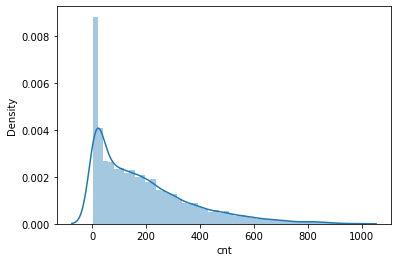

In [13]:
sns.distplot(df[target_var])

# (C) Preprocessing the dataset

### Adjusting dtypes for categorical data

In [6]:
for col in df.select_dtypes(include=("object")).columns: df[col] = df[col].astype("category")

In [7]:
num_cols = df.select_dtypes(exclude=["object","category"]).columns
cat_cols = df.select_dtypes(include=["object","category"]).columns

## (1) Quick (EDA) Checks

### Checking the Variable Relations
- Checking the Variable Relations for deterninating variables which we will be focued on 

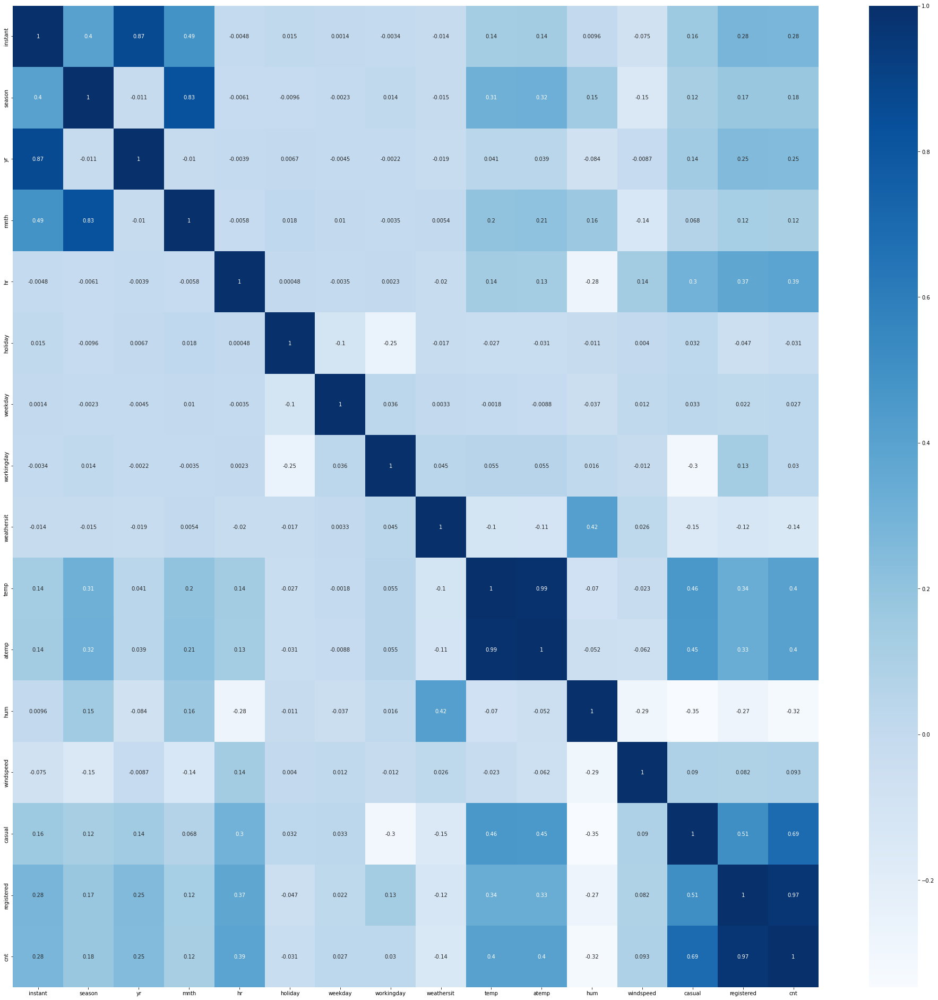

In [16]:
# Extracting the relations
corr = df.corr()

# Configurating plot
col_size = len(df.columns)
plt.figure(figsize=(col_size*2,col_size*2))

# Plotting
sns.heatmap(corr, annot=True, cmap="Blues");

Text(0.5, 1.0, 'Negative Correlation (neg> 0.7)')

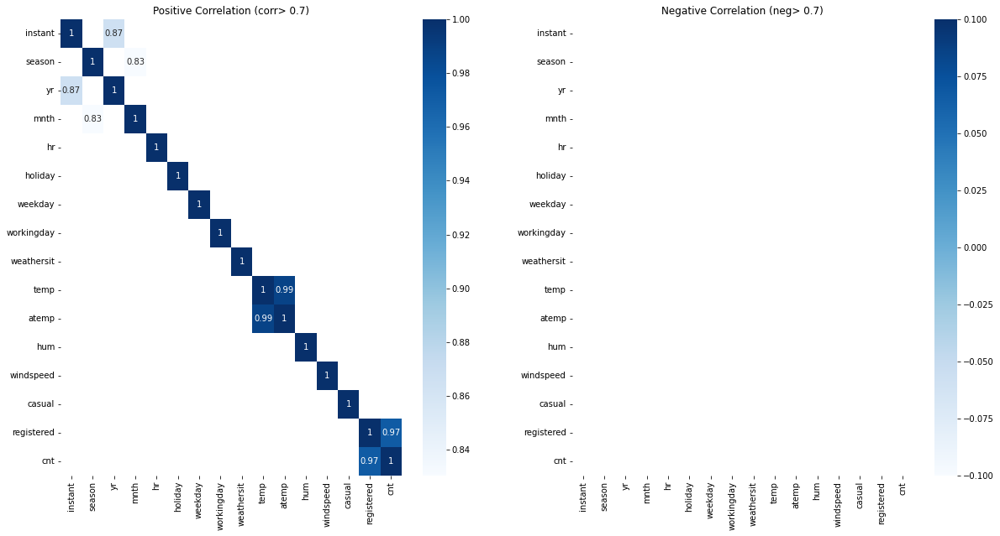

In [17]:
# Extracting the pos & neg corrs
p_th = 0.7
positive = corr[corr>p_th]

n_th = -0.7
negative = corr[corr<n_th]

# Configurating plot
col_size = len(df.columns)
plt.figure(figsize=(20,10))

# plotting as multiple axis
plt.subplot(1,2,1)
sns.heatmap(positive, annot=True, cmap="Blues");
plt.title("Positive Correlation (corr> 0.7)")

plt.subplot(1,2,2)
sns.heatmap(negative, annot=True, cmap="Blues");
plt.title("Negative Correlation (neg> 0.7)")

### Distribution Check

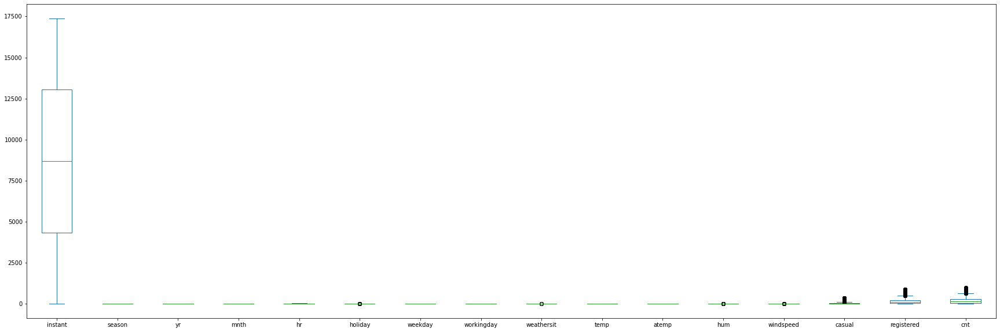

In [18]:
df.plot.box(figsize=(30,10));

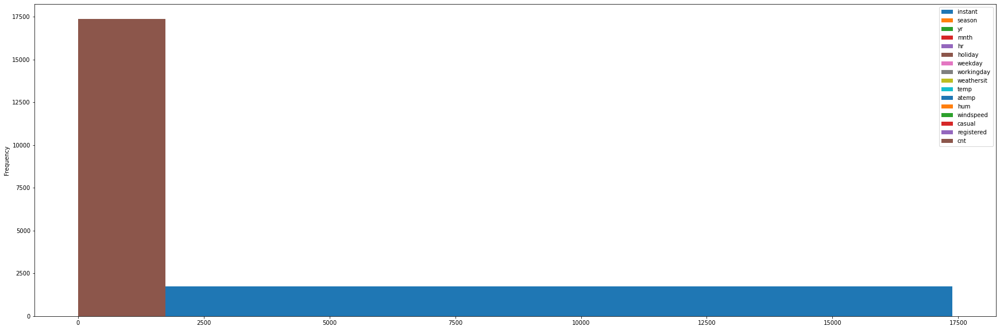

In [19]:
df.plot.hist(figsize=(30,10));

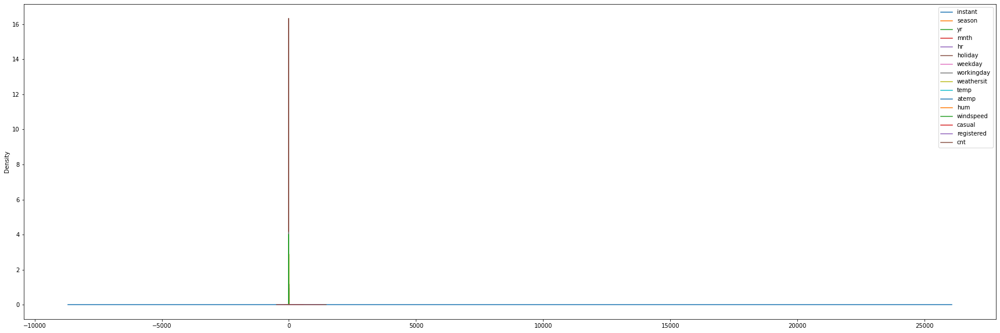

In [20]:
df.plot.kde(figsize=(30,10));

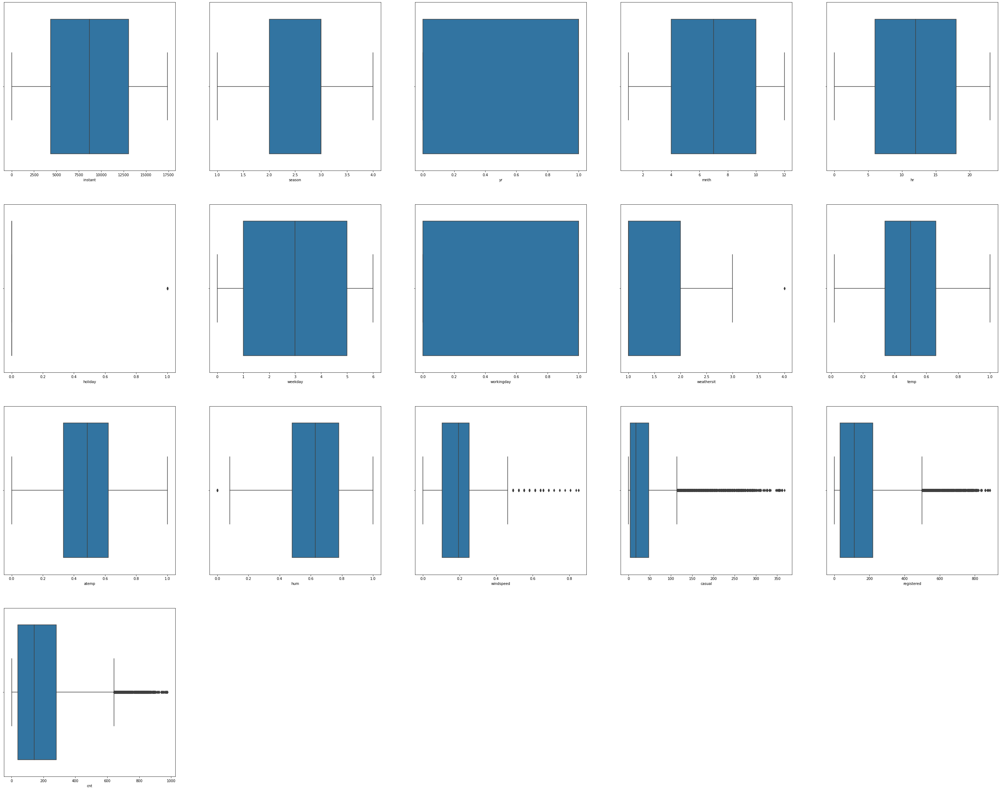

In [157]:
size = len(df.columns)
cs, rs = (5, size//5+1) if size >=5 else (3, size//3+1)

plt.figure(figsize=(cs*10, rs*10))
for i, col in enumerate(num_cols):
  plt.subplot(rs,cs,i+1)
  sns.boxplot(df[col])
  

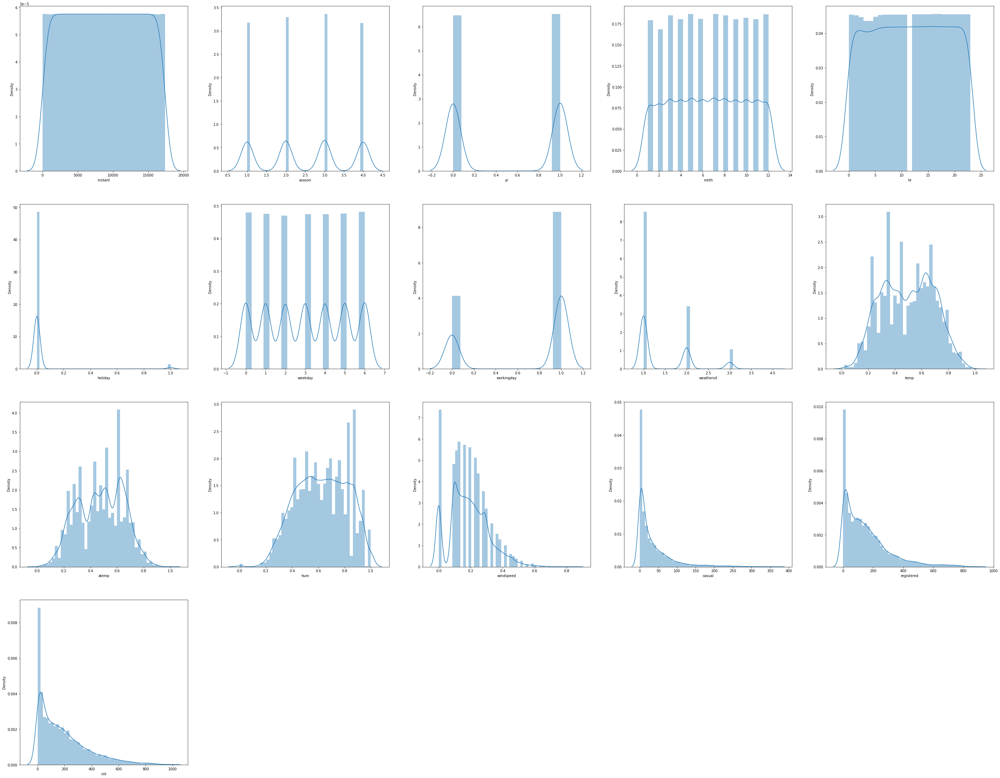

In [158]:
size = len(num_cols)
cs, rs = (5, size//5+1) if size >=5 else (3, size//3+1)

plt.figure(figsize=(cs*10, rs*10))
for i, col in enumerate(num_cols):
  plt.subplot(rs,cs,i+1)
  sns.distplot(df[col])

<AxesSubplot:xlabel='cnt', ylabel='Density'>

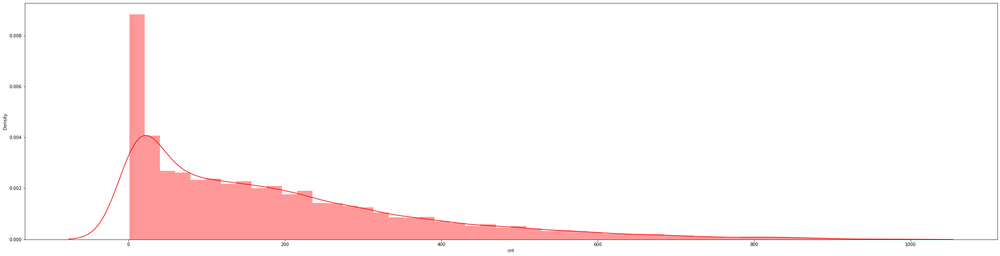

In [159]:
# Configurating plotings
plt.figure(figsize=(40,10))

sns.distplot( df[target_var], color='r')

## (2) Missing Value 

### Finding out the missing values

In [22]:
# find the null values
df.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

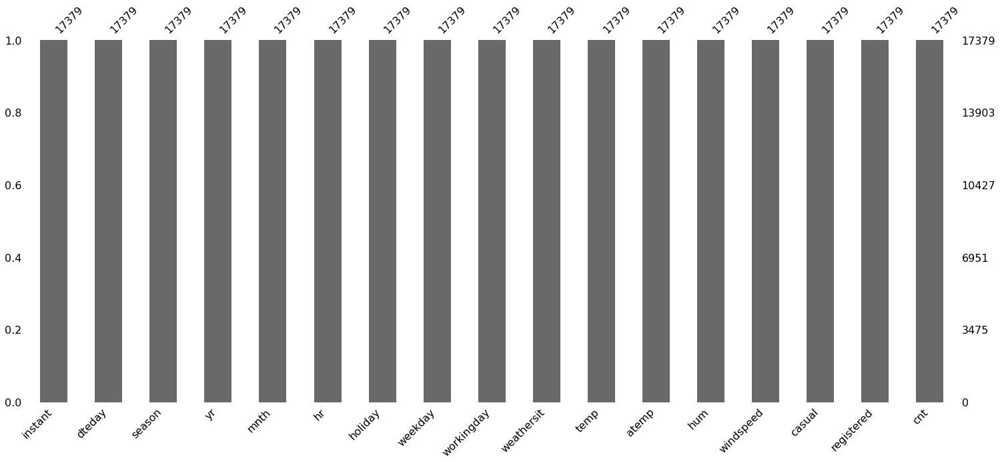

In [23]:
import missingno as msno
msno.bar(df);

<AxesSubplot:>

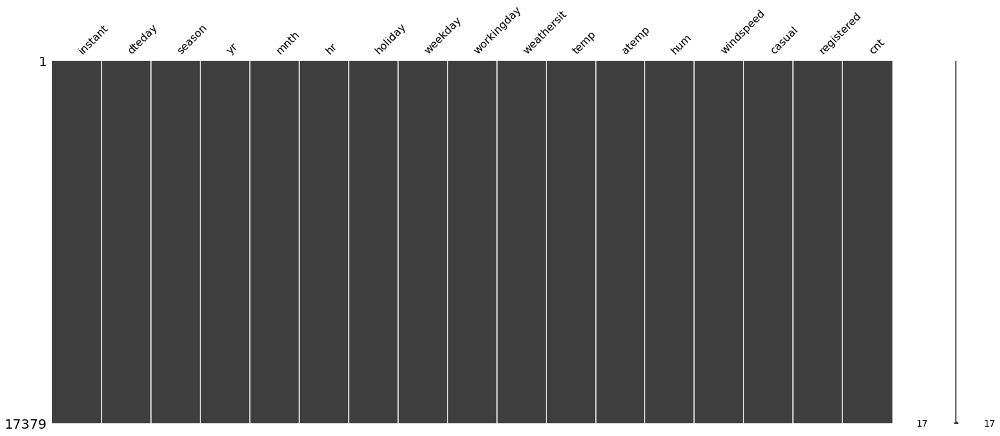

In [24]:
msno.matrix(df)

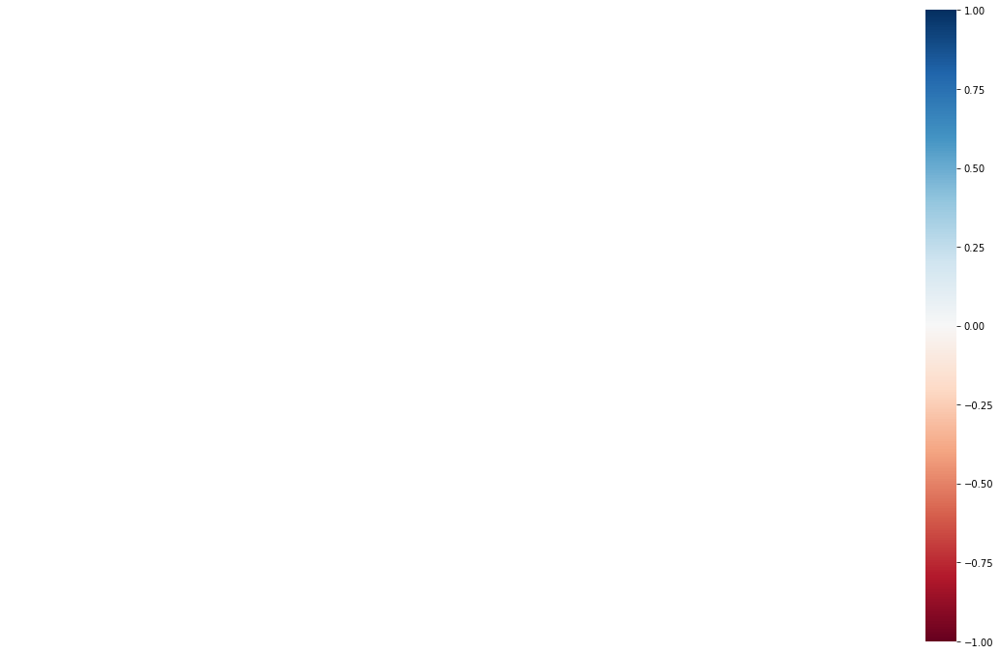

In [25]:
msno.heatmap(df);

### Handling The Missing Values
- There is no missing value

## (3) Outlier Analysis
- Outliers must be analyse according to re-sampling method because of to detect anomaly (Fraud Detection).

### Visual Approach

In [8]:
target_var = "cnt"

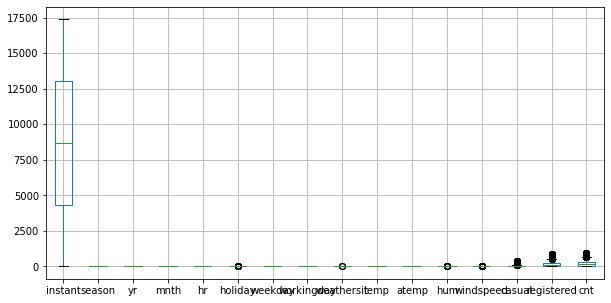

In [9]:
plt.figure(figsize=(10,5));
df.boxplot();

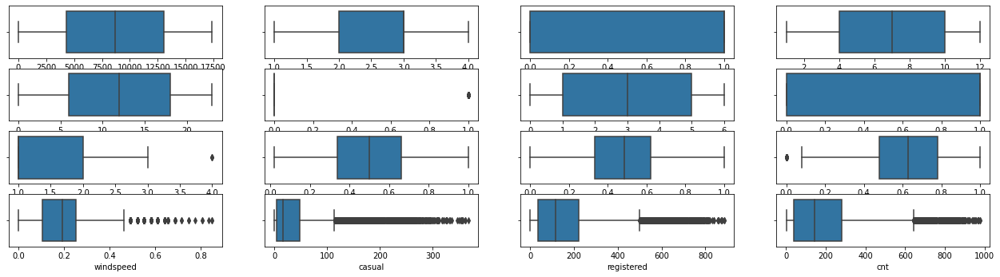

In [10]:
cum_col_sie = len(df.columns)

plt.figure(figsize=(22, 7))
for i, col in enumerate(df.select_dtypes(exclude=("object","category")).columns):
  plt.subplot(5, cum_col_sie//5+1, i+1)
  sns.boxplot(df[col]);

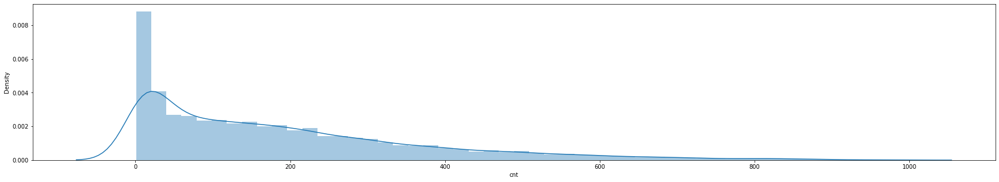

In [11]:
plt.figure(figsize=(30, 5))
sns.distplot(df[target_var]);

### IQR approach

- Note that
  - If you want to change a certain pertantage of the data for handling outliers.
    - You can adjust the ratio param forn  IQR_calculator funct to adjust inliar range.
  - If the ratio increate, 
    - outlier count will be reduce. Just the most outliers will be captured. 

#### Calculating IQR
- Calculates
  - __IQR__ pandas series for all the given variables
  - __l_th__ lower_threashold pandas series for all the given variables
  - __h_th__ higher_threashold pandas series for all the given variables

In [9]:
def IQR_calculator(df, ratio=1.5):
    # Calculating the quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    
    # IQR range calculation
    IQR = Q3 -Q1

    # Determinating the boundaries
    lower_threashold = Q1 - ratio * IQR
    higher_threashold = Q3 + ratio *IQR
    
    return IQR, lower_threashold, higher_threashold

In [10]:
IQR, l_th, h_th = IQR_calculator(df.drop(columns=[target_var]), ratio=1.5)

In [11]:
from pprint import pprint
for i in [IQR, l_th, h_th]:
  print("-"*20)
  pprint(i)
  print("-"*20, end="\n"*2)

--------------------
instant       8689.0000
season           1.0000
yr               1.0000
mnth             6.0000
hr              12.0000
holiday          0.0000
weekday          4.0000
workingday       1.0000
weathersit       1.0000
temp             0.3200
atemp            0.2879
hum              0.3000
windspeed        0.1492
casual          44.0000
registered     186.0000
dtype: float64
--------------------

--------------------
instant      -8688.00000
season           0.50000
yr              -1.50000
mnth            -5.00000
hr             -12.00000
holiday          0.00000
weekday         -5.00000
workingday      -1.50000
weathersit      -0.50000
temp            -0.14000
atemp           -0.09855
hum              0.03000
windspeed       -0.11930
casual         -62.00000
registered    -245.00000
dtype: float64
--------------------

--------------------
instant       26068.00000
season            4.50000
yr                2.50000
mnth             19.00000
hr               36.0000

### Finding out The outlier values
- Finds __is_outlier__ and __is_outlier_val__ dataframes which include boolean value for ever individual value.

In [12]:
def find_outlier_single(data:pd.DataFrame, lower_threashold:float, higher_threashold:float)->pd.DataFrame:
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df

In [13]:
def find_outlier(df:pd.DataFrame, lower_threashold:pd.Series, higher_threashold:pd.Series)->pd.DataFrame:
    data = df[lower_threashold.index]
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df

In [14]:
# Getting the outlier indexes
is_outlier = find_outlier(df.drop(columns=[target_var]), l_th, h_th)
is_outlier.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [15]:
is_outlier.sum()

instant          0
season           0
yr               0
mnth             0
hr               0
holiday        500
weekday          0
workingday       0
weathersit       3
temp             0
atemp            0
hum             22
windspeed      342
casual        1192
registered     680
dtype: int64

In [16]:
outlier_ratios = (is_outlier.sum() / df[is_outlier.columns].count()).sort_values(ascending=False)
outlier_ratios

casual        0.068589
registered    0.039128
holiday       0.028770
windspeed     0.019679
hum           0.001266
weathersit    0.000173
instant       0.000000
season        0.000000
yr            0.000000
mnth          0.000000
hr            0.000000
weekday       0.000000
workingday    0.000000
temp          0.000000
atemp         0.000000
dtype: float64

In [17]:
signf = 0.05
top_outlier =  outlier_ratios[outlier_ratios > signf]
top_outlier

casual    0.068589
dtype: float64

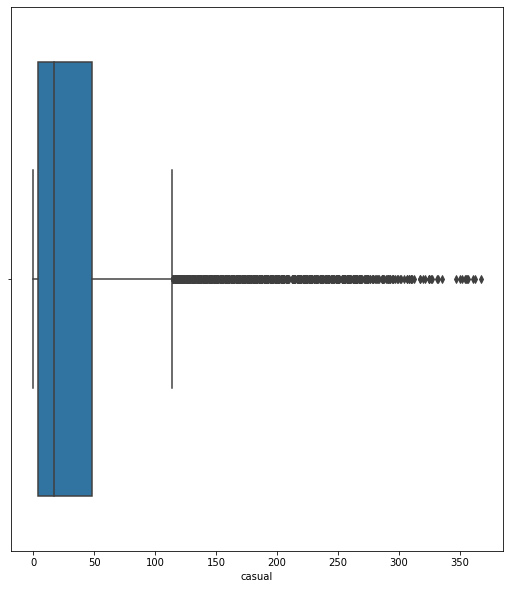

In [18]:
top_outlier_name = top_outlier.index
size=len(top_outlier)

cs, rs = (5, size//5+1) if size>=5 else (3, size//3+1) 

plt.figure(figsize=(cs*10,rs*10))
for i, col in enumerate(top_outlier_name):
  plt.subplot(rs, cs, i+1)
  sns.boxplot(df[col])

In [19]:
for col in top_outlier_name:
  print(f"{col:<8} number of unique values: {len(df[col].unique()):>5}")

casual   number of unique values:   322


In [20]:
outlier_cols = top_outlier_name
outlier_cols

Index(['casual'], dtype='object')

### Handling outlier

#### Util Functions

In [21]:
def mean_assignment(data:pd.Series, is_outlier:pd.Series, value:float):
  "It assigns given value to the outlier values"
  data[is_outlier] = value
  return data

# usage # df["c1"] = mean_assignment(df["c1"], is_outlier["c1"], df["c1"].mean()):

In [22]:
def boundary_casting(data:pd.Series, l_th:float, h_th:float):
  "It assigns border values to the outlier values"
  
  data[ data < l_th ] = l_th
  data[ h_th < data ] = h_th

  return data

In [23]:
df[is_outlier[outlier_cols[0]]][outlier_cols[0]].head()

1633    144
1634    149
1635    124
1771    126
1772    174
Name: casual, dtype: int64

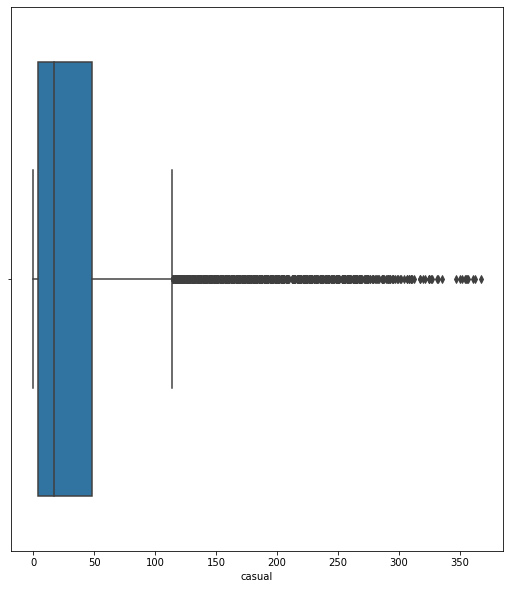

In [24]:
size=len(outlier_cols)
cs, rs = (5, size//5+1) if size>=5 else (3, size//3+1) 

plt.figure(figsize=(cs*10,rs*10))
for i, col in enumerate(outlier_cols):
  plt.subplot(rs, cs, i+1)
  sns.boxplot(df[col])

In [25]:
df[is_outlier[outlier_cols[0]]][outlier_cols[0]].head()

1633    144
1634    149
1635    124
1771    126
1772    174
Name: casual, dtype: int64

In [26]:
# Handling outliers
for col in outlier_cols: df[col] = boundary_casting(df[col], l_th[col], h_th[col])

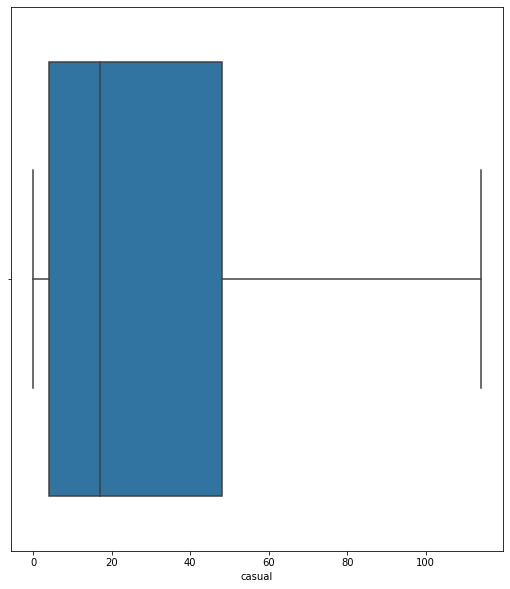

In [27]:
size=len(outlier_cols)
cs, rs = (5, size//5+1) if size>=5 else (3, size//3+1) 

plt.figure(figsize=(cs*10,rs*10))
for i, col in enumerate(outlier_cols):
  plt.subplot(rs, cs, i+1)
  sns.boxplot(df[col])

# (D) Exploratory Data Analysis

## Dataset 

### Spesifications

In [78]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   instant     17379 non-null  int64   
 1   dteday      17379 non-null  category
 2   season      17379 non-null  int64   
 3   yr          17379 non-null  int64   
 4   mnth        17379 non-null  int64   
 5   hr          17379 non-null  int64   
 6   holiday     17379 non-null  int64   
 7   weekday     17379 non-null  int64   
 8   workingday  17379 non-null  int64   
 9   weathersit  17379 non-null  int64   
 10  temp        17379 non-null  float64 
 11  atemp       17379 non-null  float64 
 12  hum         17379 non-null  float64 
 13  windspeed   17379 non-null  float64 
 14  casual      17379 non-null  int64   
 15  registered  17379 non-null  int64   
 16  cnt         17379 non-null  int64   
dtypes: category(1), float64(4), int64(12)
memory usage: 2.2 MB


In [79]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,17379.0,8690.000000,5017.029500,1.00,4345.5000,8690.0000,13034.5000,17379.0000
season,17379.0,2.501640,1.106918,1.00,2.0000,3.0000,3.0000,4.0000
yr,17379.0,0.502561,0.500008,0.00,0.0000,1.0000,1.0000,1.0000
mnth,17379.0,6.537775,3.438776,1.00,4.0000,7.0000,10.0000,12.0000
hr,17379.0,11.546752,6.914405,0.00,6.0000,12.0000,18.0000,23.0000
holiday,17379.0,0.028770,0.167165,0.00,0.0000,0.0000,0.0000,1.0000
weekday,17379.0,3.003683,2.005771,0.00,1.0000,3.0000,5.0000,6.0000
workingday,17379.0,0.682721,0.465431,0.00,0.0000,1.0000,1.0000,1.0000
weathersit,17379.0,1.425283,0.639357,1.00,1.0000,1.0000,2.0000,4.0000
temp,17379.0,0.496987,0.192556,0.02,0.3400,0.5000,0.6600,1.0000


In [80]:
pd.unique(df.select_dtypes(include=["object","category"]).values.ravel('k'))

array(['2011-01-01', '2011-01-02', '2011-01-03', '2011-01-04',
       '2011-01-05', '2011-01-06', '2011-01-07', '2011-01-08',
       '2011-01-09', '2011-01-10', '2011-01-11', '2011-01-12',
       '2011-01-13', '2011-01-14', '2011-01-15', '2011-01-16',
       '2011-01-17', '2011-01-18', '2011-01-19', '2011-01-20',
       '2011-01-21', '2011-01-22', '2011-01-23', '2011-01-24',
       '2011-01-25', '2011-01-26', '2011-01-27', '2011-01-28',
       '2011-01-29', '2011-01-30', '2011-01-31', '2011-02-01',
       '2011-02-02', '2011-02-03', '2011-02-04', '2011-02-05',
       '2011-02-06', '2011-02-07', '2011-02-08', '2011-02-09',
       '2011-02-10', '2011-02-11', '2011-02-12', '2011-02-13',
       '2011-02-14', '2011-02-15', '2011-02-16', '2011-02-17',
       '2011-02-18', '2011-02-19', '2011-02-20', '2011-02-21',
       '2011-02-22', '2011-02-23', '2011-02-24', '2011-02-25',
       '2011-02-26', '2011-02-27', '2011-02-28', '2011-03-01',
       '2011-03-02', '2011-03-03', '2011-03-04', '2011-

## Univariate Analysis

In [81]:
num_cols = df.select_dtypes(include=("int64","float64"), exclude=("bool") ).columns
cat_cols = df.select_dtypes(exclude=("int64","float64")).columns

In [82]:
num_cols

Index(['instant', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [83]:
len(df.columns), df.columns

(17,
 Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
        'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
        'casual', 'registered', 'cnt'],
       dtype='object'))

In [84]:
df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   dteday  17379 non-null  category
dtypes: category(1)
memory usage: 55.9 KB


In [85]:
df[num_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   season      17379 non-null  int64  
 2   yr          17379 non-null  int64  
 3   mnth        17379 non-null  int64  
 4   hr          17379 non-null  int64  
 5   holiday     17379 non-null  int64  
 6   weekday     17379 non-null  int64  
 7   workingday  17379 non-null  int64  
 8   weathersit  17379 non-null  int64  
 9   temp        17379 non-null  float64
 10  atemp       17379 non-null  float64
 11  hum         17379 non-null  float64
 12  windspeed   17379 non-null  float64
 13  casual      17379 non-null  int64  
 14  registered  17379 non-null  int64  
 15  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12)
memory usage: 2.1 MB


### Target Variable

In [86]:
target_var = "cnt"

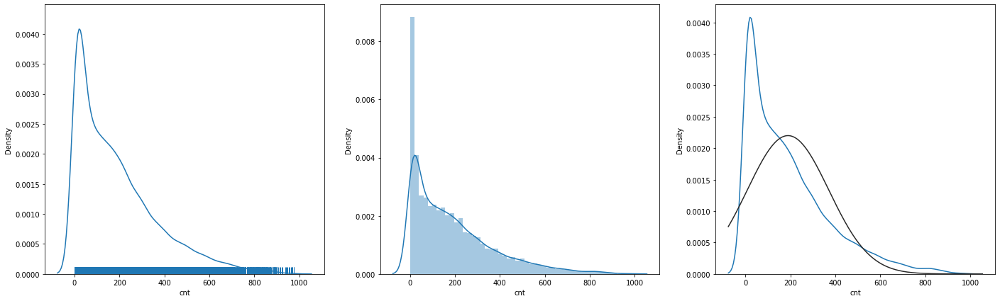

In [87]:
from scipy.stats import norm

plt.figure(figsize=(24,7))

plt.subplot(1,3,1)
sns.distplot(df[target_var], rug=True, hist=False);

plt.subplot(1,3,2)
sns.distplot(df[target_var], rug=False, hist=True);

plt.subplot(1,3,3)
sns.distplot(df[target_var], fit=norm, rug=False, hist=False);

### Feature Variables [Numerical]

#### setting the plotting params

In [88]:
# Defining the params
target_var = "cnt"
#num_cols = df.select_dtypes(exclude='category').columns
num_col_size = len(num_cols)
cols, rows = (3, num_col_size//3 + 1) if num_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

#### [histplot] Distributions

In [89]:
num_cols

Index(['instant', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

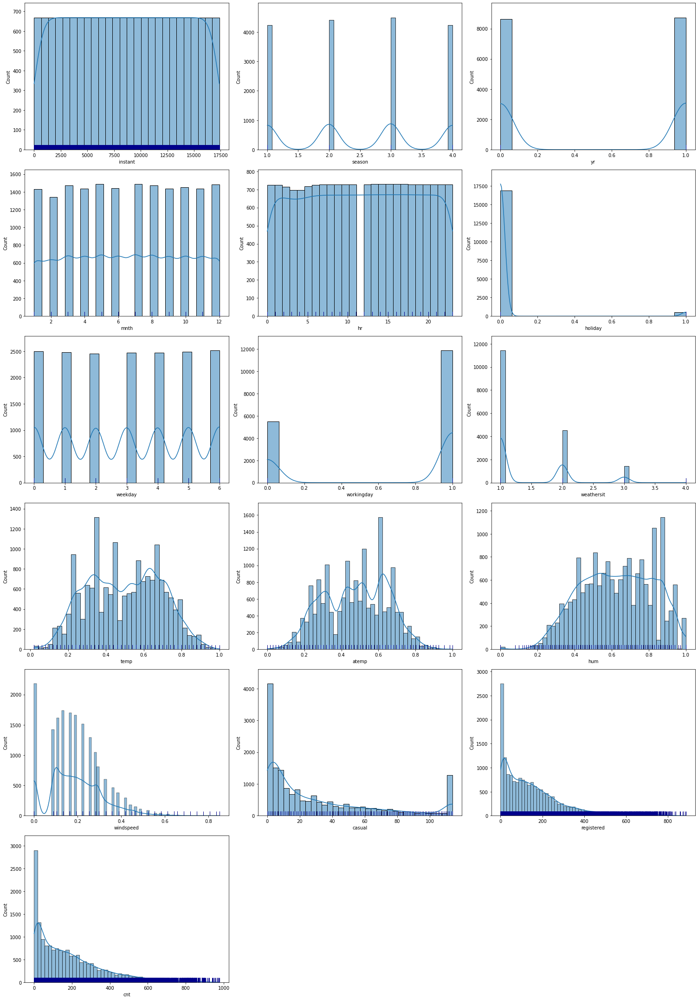

In [90]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, kde=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

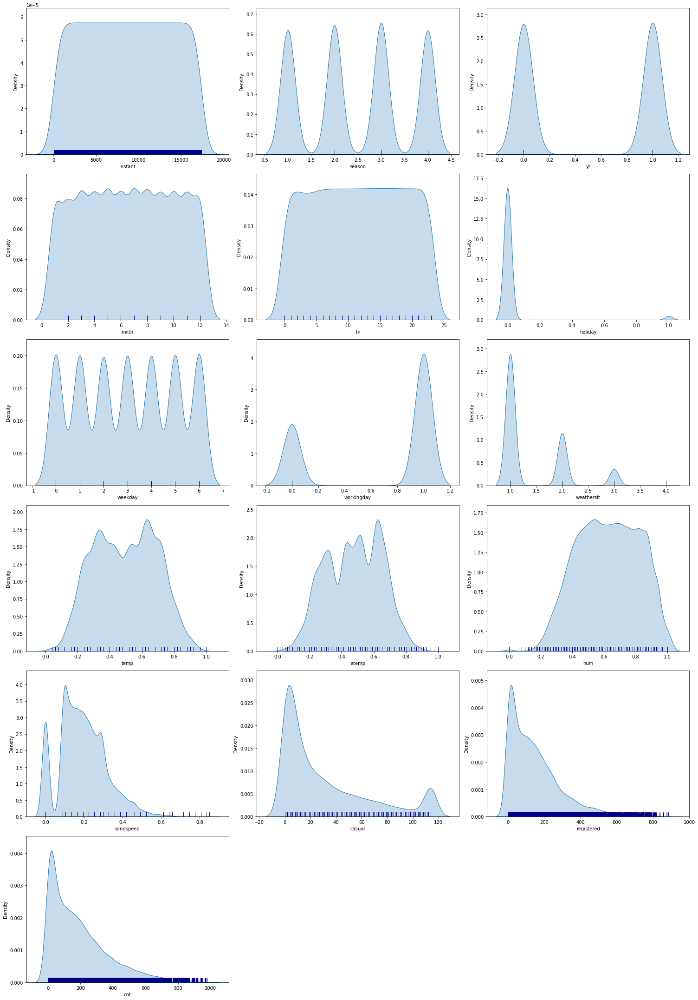

In [91]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.kdeplot(x=df[col], data=df ,shade=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

#### [boxplot] Distributions with quartiles (Outlier)

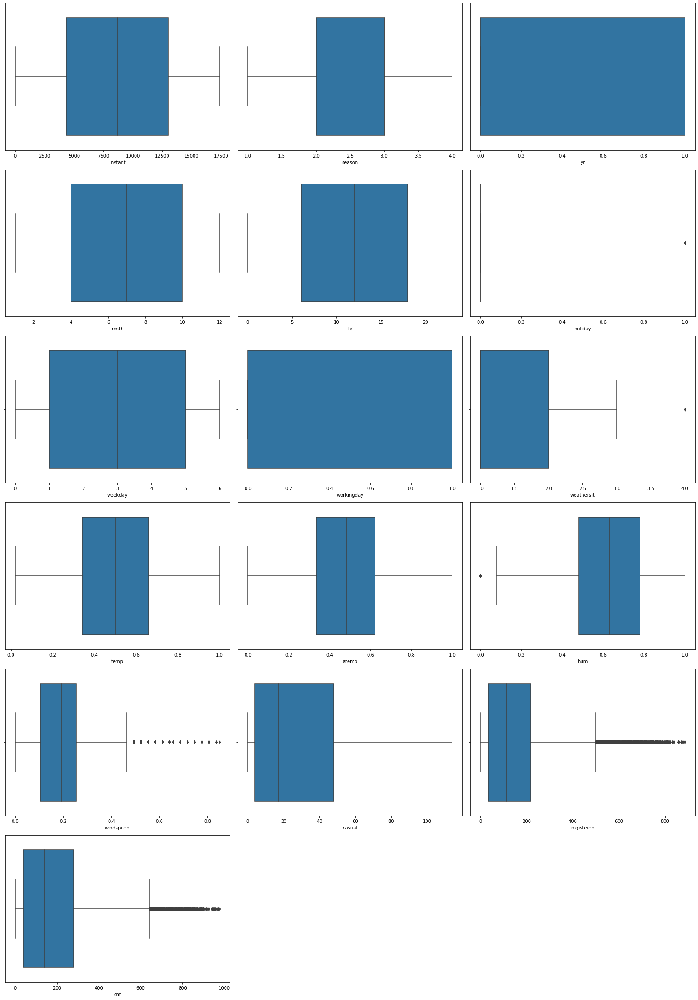

In [92]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.boxplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [violinplot] Distributions with quartiles and density

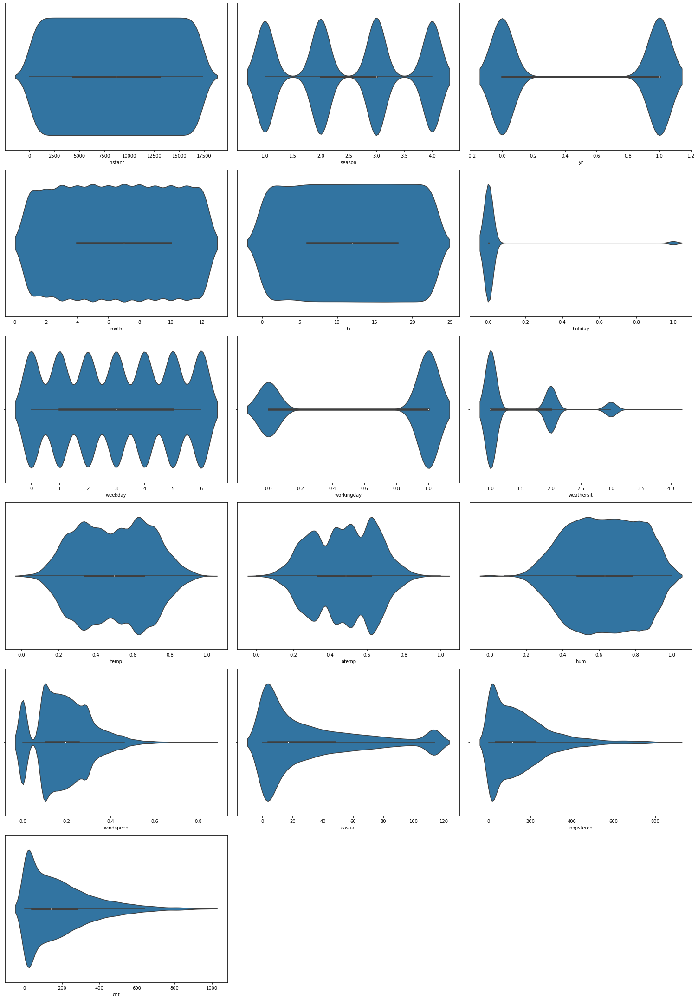

In [93]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # violinplot
    sns.violinplot(x=df[col], show_medians=True, ax=ax)
    
fig.tight_layout()  
plt.show()

#### [stripplot] spread of the data with stripplot

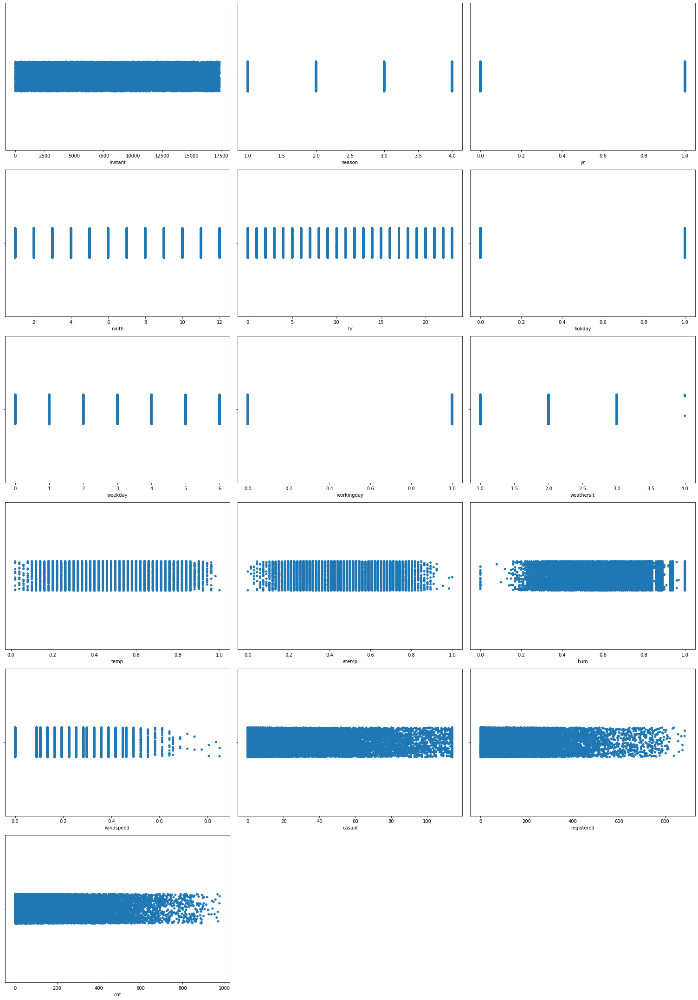

In [94]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # stripplot
    sns.stripplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [swarmplot] spread of the data with stripplot (avoids overlap)
```python
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # swarmplot
    sns.swarmplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()
```

#### [scatterplot] Spread of data 

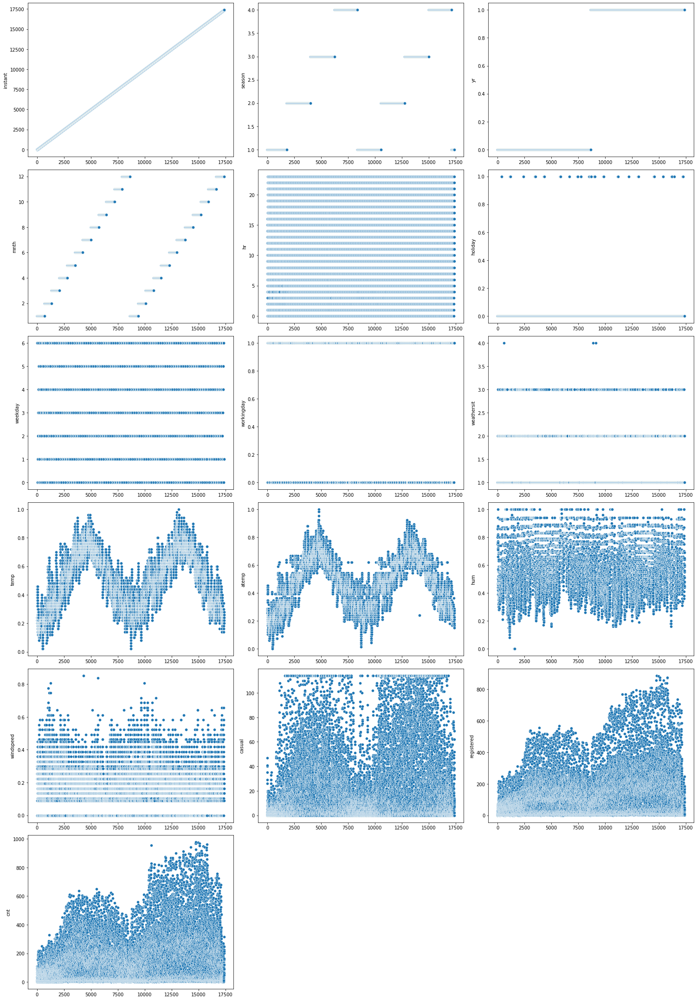

In [95]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # scatterplot
    sns.scatterplot(x = df[col].index, y= df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [lineplot] Trend

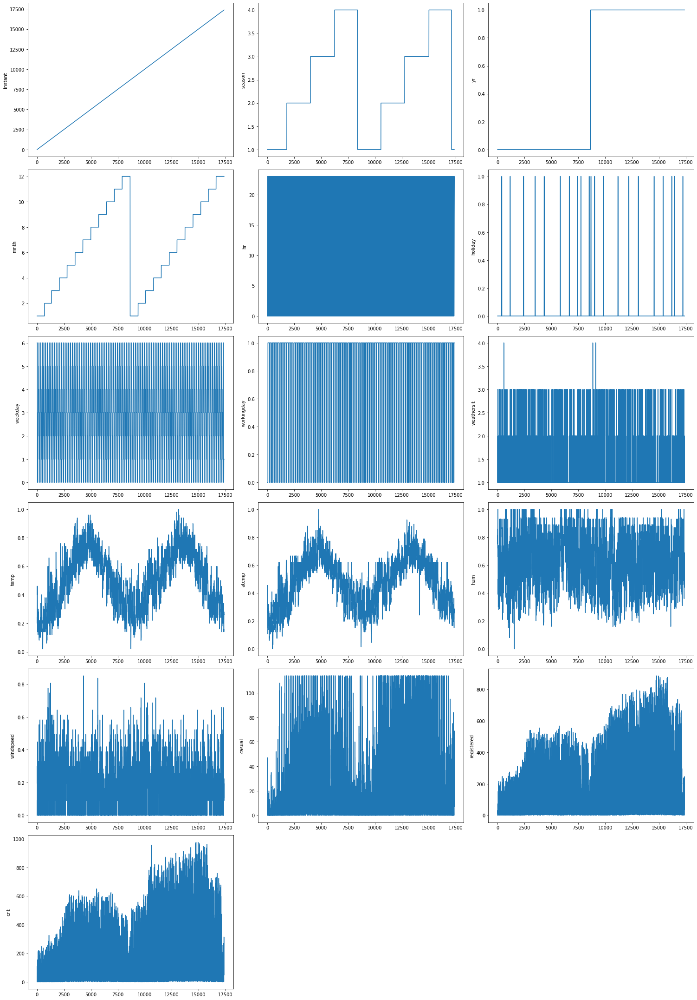

In [96]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.lineplot(x=df[col].index, y=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

### Feature Variables [Categorical]

#### setting the plotting params

In [97]:
# Defining the params
target_var = "cnt"
#num_cols = df.select_dtypes(exclude='category').columns
cat_col_size = len(cat_cols)
cols, rows = (3, cat_col_size//3 + 1) if cat_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

In [98]:
cat_cols

Index(['dteday'], dtype='object')

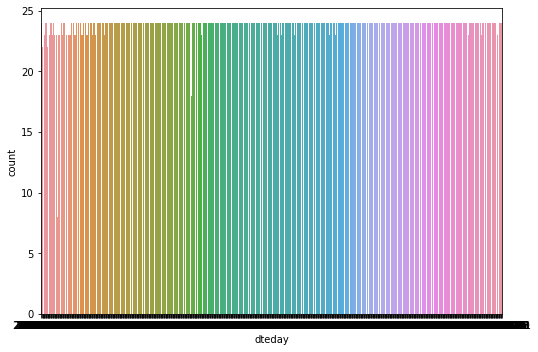

In [99]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.countplot(x=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

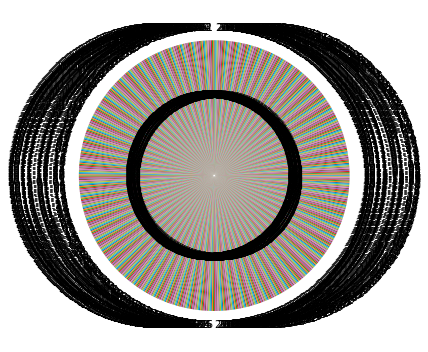

In [100]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
  
    # boxplot
    plt.pie(df[col].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

## Relations

### Quick Variable Relation

In [101]:
def rel_filter(df:pd.DataFrame, th:float)->pd.DataFrame:
  # Calculating the relations
  corr = df.corr()

  # filtering the relations
  filtered_corr = corr[corr > th]  if th > 0.0 else corr[corr < th]

  return filtered_corr

def rel_plotter(corr:pd.DataFrame, title:str="Correlations", figsize:tuple=None, cmap="Blues", annot=True):
  
  # plotting configurations
  if figsize != None: plt.figure(figsize=figsize)

  # plotting the relattions
  sns.heatmap(corr, cmap="Blues", annot=True)
  plt.title(title);

def get_relations(corr:pd.DataFrame, th:float)->list:

  # decleration of params
  columns = corr.columns
  is_exceed = (lambda rel: rel > th)  if th > 0 else (lambda rel: rel < th)  

  # getting the column names which exceedes the threashold
  filtered_relations = list()
  for row in columns:
    for col in columns:
        
        # Pass the correaltion with itself
        if col==row: continue

        # Collect variables which exvide threashold correlation 
        cur_corr = corr.loc[row, col]
        if  is_exceed(cur_corr):

          # Check whether the record have already added
          is_already_added = [ all([ e in record for e in [row, col] ])  for record in filtered_relations ]
          
          # Add if it have not already added
          if not any(is_already_added): filtered_relations.append([row, col, np.round(cur_corr, 2)]) 
  
  return filtered_relations

In [102]:
get_relations(df.corr(), 0.85), get_relations(df.corr(), 0.85)

([['instant', 'yr', 0.87],
  ['temp', 'atemp', 0.99],
  ['registered', 'cnt', 0.97]],
 [['instant', 'yr', 0.87],
  ['temp', 'atemp', 0.99],
  ['registered', 'cnt', 0.97]])

In [103]:
get_relations(df.corr(), 0.5), get_relations(df.corr(), 0.5)

([['instant', 'yr', 0.87],
  ['season', 'mnth', 0.83],
  ['temp', 'atemp', 0.99],
  ['temp', 'casual', 0.54],
  ['atemp', 'casual', 0.53],
  ['casual', 'registered', 0.58],
  ['casual', 'cnt', 0.74],
  ['registered', 'cnt', 0.97]],
 [['instant', 'yr', 0.87],
  ['season', 'mnth', 0.83],
  ['temp', 'atemp', 0.99],
  ['temp', 'casual', 0.54],
  ['atemp', 'casual', 0.53],
  ['casual', 'registered', 0.58],
  ['casual', 'cnt', 0.74],
  ['registered', 'cnt', 0.97]])

In [104]:
get_relations(df.corr(), (-0.7)), get_relations(df.corr(),  (-0.7))

([], [])

In [105]:
get_relations(df.corr(), -0.5), get_relations(df.corr(), -0.5)

([], [])

In [106]:
def get_var_corrs(df:pd.DataFrame, var:str, top_n:int=5, th:float=None):
  # checking the params whether valid
  if var not in df.columns: raise f"'{var}' column does not exist in the dataframe"

  # Calculating the correlation
  var_corrs = df.corr()[var].drop(var)

  # Filtering & sorting 
  if th != None:

    # Filtering
    filter = (lambda df: df[df > th] )  if th > 0 else (lambda df: df[df < th]) 
    var_corrs = filter(var_corrs)
    
    # Sorting
    is_asc = False if th > 0 else True
    var_corrs = var_corrs.sort_values(ascending=is_asc)
    var_corrs = var_corrs[:top_n]

  return var_corrs

In [107]:
p_corrs = get_var_corrs(df, target_var, top_n=5, th=0.25)
p_corrs_names = p_corrs.index
p_corrs

registered    0.972151
casual        0.737881
temp          0.404772
atemp         0.400929
hr            0.394071
Name: cnt, dtype: float64

In [108]:
n_corrs = get_var_corrs(df, target_var, top_n=5, th=-0.25)
n_corrs_names = n_corrs.index
n_corrs

hum   -0.322911
Name: cnt, dtype: float64

### Correlation

In [109]:
df.corr()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,1.000000,0.404046,0.866014,0.489164,-0.004775,0.014723,0.001357,-0.003416,-0.014198,0.136178,0.137615,0.009577,-0.074505,0.162987,0.282046,0.278379
season,0.404046,1.000000,-0.010742,0.830386,-0.006117,-0.009585,-0.002335,0.013743,-0.014524,0.312025,0.319380,0.150625,-0.149773,0.147774,0.174226,0.178056
yr,0.866014,-0.010742,1.000000,-0.010473,-0.003867,0.006692,-0.004485,-0.002196,-0.019157,0.040913,0.039222,-0.083546,-0.008740,0.136755,0.253684,0.250495
mnth,0.489164,0.830386,-0.010473,1.000000,-0.005772,0.018430,0.010400,-0.003477,0.005400,0.201691,0.208096,0.164411,-0.135386,0.088244,0.122273,0.120638
hr,-0.004775,-0.006117,-0.003867,-0.005772,1.000000,0.000479,-0.003498,0.002285,-0.020203,0.137603,0.133750,-0.276498,0.137252,0.372561,0.374141,0.394071
holiday,0.014723,-0.009585,0.006692,0.018430,0.000479,1.000000,-0.102088,-0.252471,-0.017036,-0.027340,-0.030973,-0.010588,0.003988,0.027831,-0.047345,-0.030927
weekday,0.001357,-0.002335,-0.004485,0.010400,-0.003498,-0.102088,1.000000,0.035955,0.003311,-0.001795,-0.008821,-0.037158,0.011502,0.022415,0.021578,0.026900
workingday,-0.003416,0.013743,-0.002196,-0.003477,0.002285,-0.252471,0.035955,1.000000,0.044672,0.055390,0.054667,0.015688,-0.011830,-0.248167,0.134326,0.030284
weathersit,-0.014198,-0.014524,-0.019157,0.005400,-0.020203,-0.017036,0.003311,0.044672,1.000000,-0.102640,-0.105563,0.418130,0.026226,-0.169806,-0.120966,-0.142426
temp,0.136178,0.312025,0.040913,0.201691,0.137603,-0.027340,-0.001795,0.055390,-0.102640,1.000000,0.987672,-0.069881,-0.023125,0.536479,0.335361,0.404772


<AxesSubplot:>

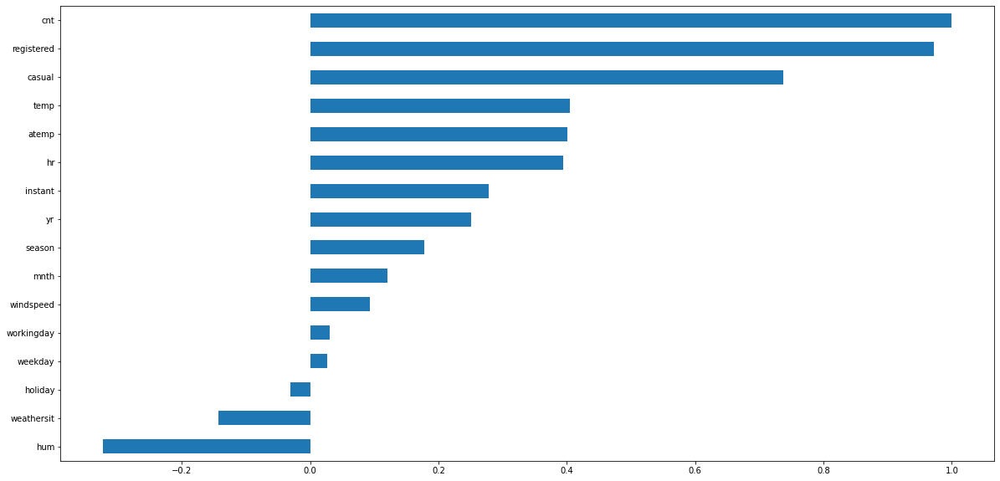

In [110]:
# Target Variable's correlation
df.corr()[target_var].sort_values().plot(kind="barh", figsize=(20,10))

<AxesSubplot:>

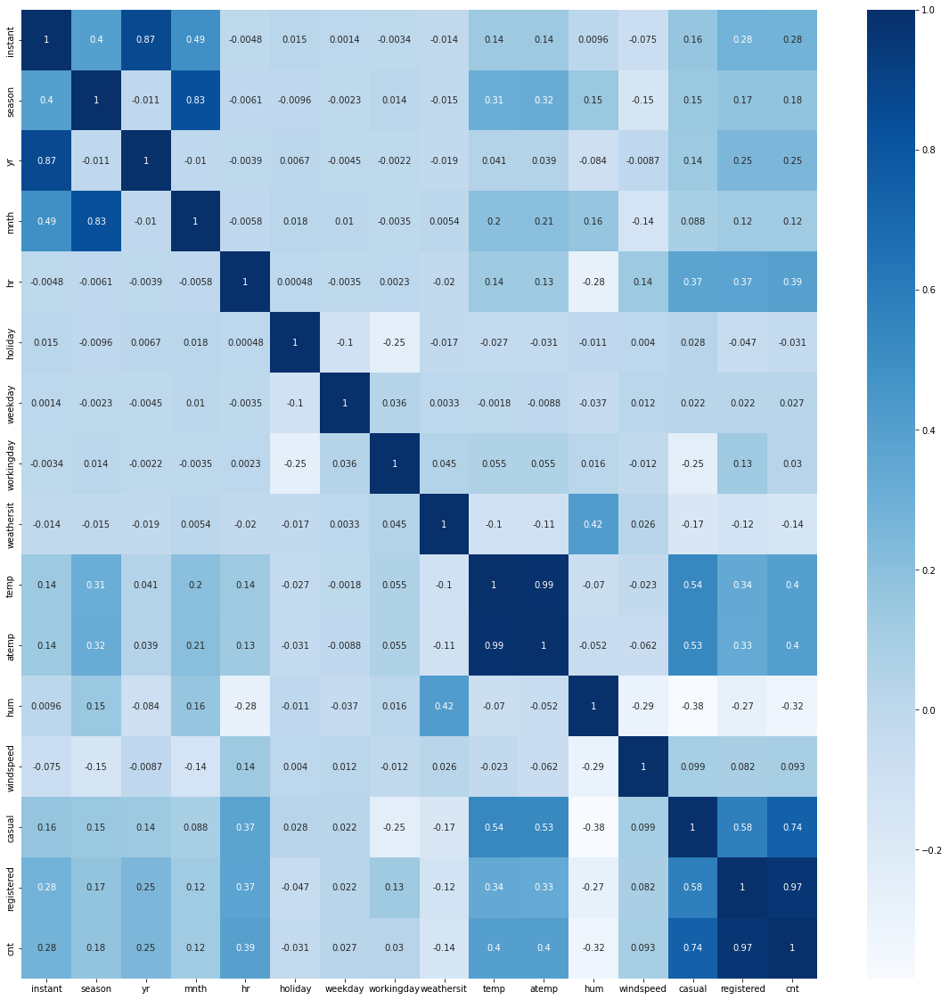

In [111]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, cmap='Blues')

<AxesSubplot:>

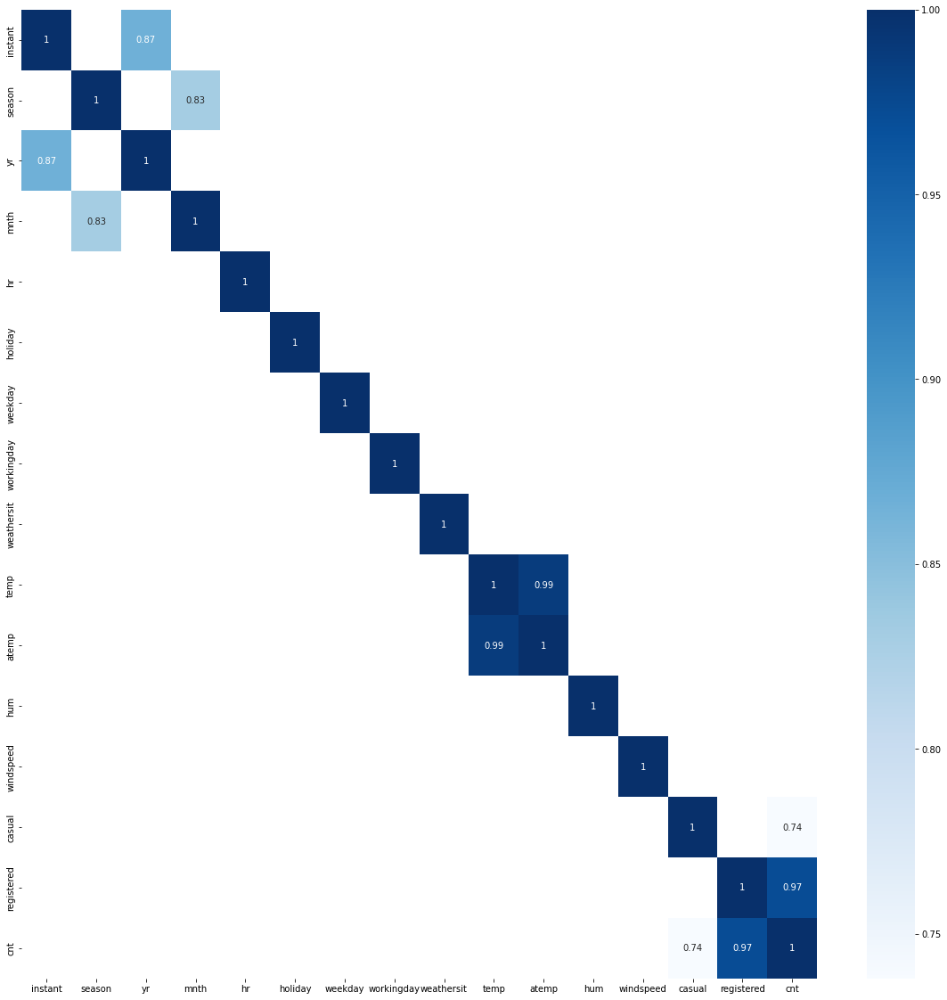

In [112]:
plt.figure(figsize=(20,20))
th = 0.7
sns.heatmap(df.corr()[df.corr() > th], annot=True, cmap='Blues')

<AxesSubplot:>

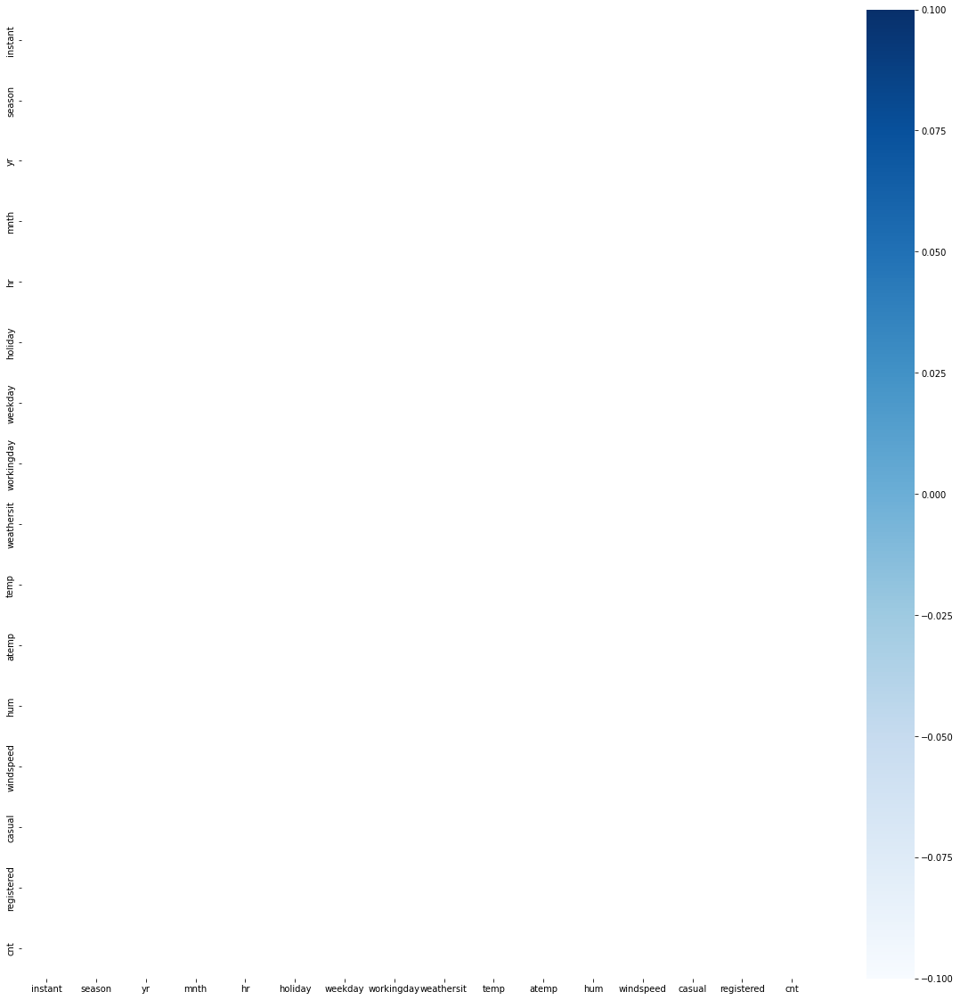

In [113]:
plt.figure(figsize=(20,20))
th = -0.7
sns.heatmap(df.corr()[df.corr() < th], annot=True, cmap='Blues')

In [114]:
target_var

'cnt'

In [115]:
target_sorted_corrs = df.corr()[target_var].drop(target_var).sort_values(ascending=False)
target_sorted_corrs

registered    0.972151
casual        0.737881
temp          0.404772
atemp         0.400929
hr            0.394071
instant       0.278379
yr            0.250495
season        0.178056
mnth          0.120638
windspeed     0.093234
workingday    0.030284
weekday       0.026900
holiday      -0.030927
weathersit   -0.142426
hum          -0.322911
Name: cnt, dtype: float64

### Variances

In [116]:
import numpy as np
variance_per_var = np.round(df.var().sort_values(ascending=False), 2)
variance_per_var

instant       25170585.00
cnt              32901.46
registered       22909.03
casual            1211.96
hr                  47.81
mnth                11.83
weekday              4.02
season               1.23
weathersit           0.41
yr                   0.25
workingday           0.22
hum                  0.04
temp                 0.04
atemp                0.03
holiday              0.03
windspeed            0.01
dtype: float64

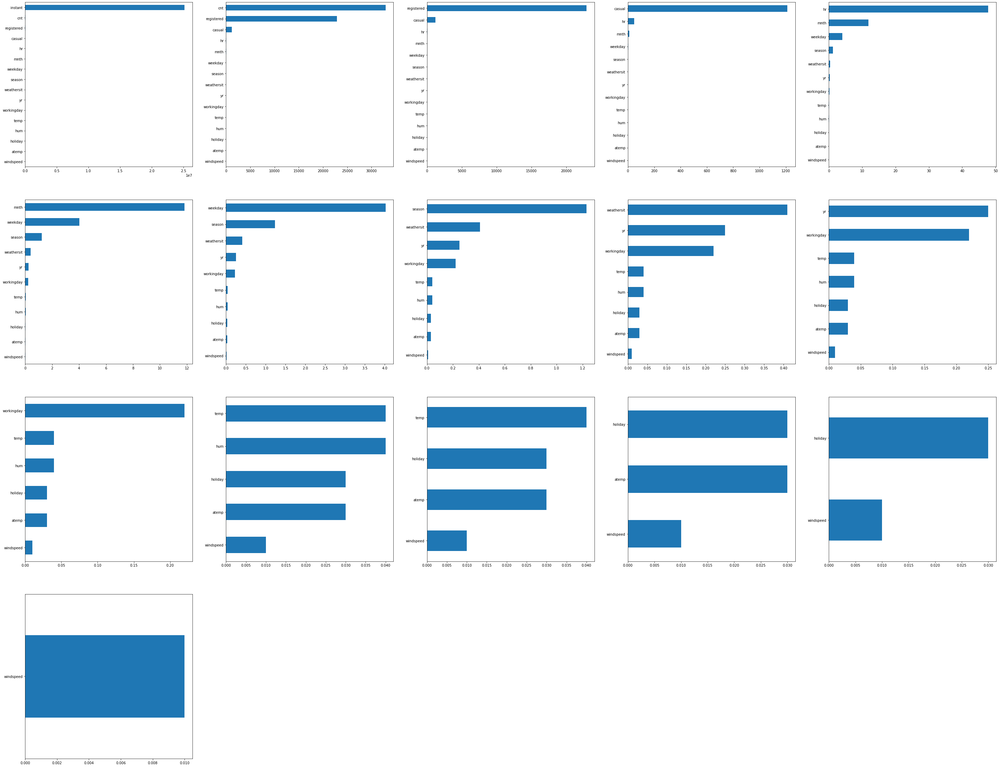

In [117]:
size = len(variance_per_var.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(variance_per_var.index):
  plt.subplot(rs, cs, i+1)
  variance_per_var[col_name:].sort_values(ascending=True).plot.barh();

In [118]:
df.var().sort_values(ascending=False).round(2)

instant       25170585.00
cnt              32901.46
registered       22909.03
casual            1211.96
hr                  47.81
mnth                11.83
weekday              4.02
season               1.23
weathersit           0.41
yr                   0.25
workingday           0.22
hum                  0.04
temp                 0.04
atemp                0.03
holiday              0.03
windspeed            0.01
dtype: float64

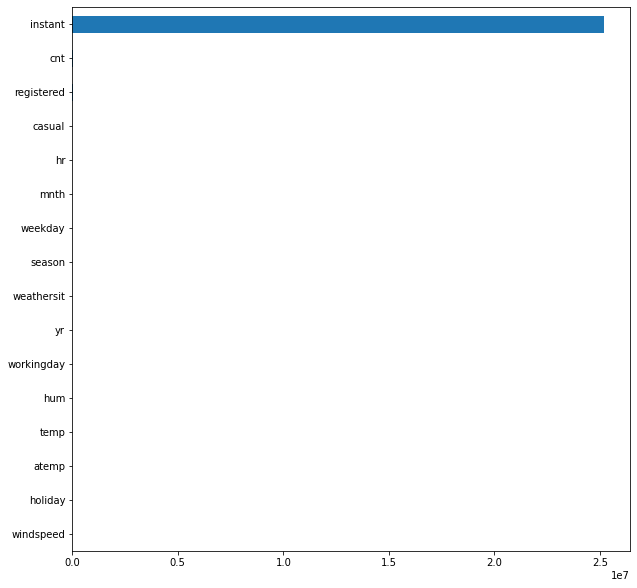

In [119]:
plt.figure(figsize=(10, 10))
df.var().sort_values(ascending=True).plot.barh();

### Covariance between target var

#### Way-1

In [120]:
def numerical_covariance(df, target_var):
    # Separate out numerical columns
    numerical_cols = df.select_dtypes(include=[int, float, "int8", bool]).columns

    # Create a copy of the DataFrame with only the numerical columns
    numerical_df = df[numerical_cols].copy()

    # If the target variable is categorical, encode it temporarily
    if df[target_var].dtype == 'object' or df[target_var].dtype == 'category':
        temp_encode = pd.get_dummies(df[target_var], prefix=target_var)
        numerical_df = pd.concat([numerical_df, temp_encode], axis=1)
        target_var = temp_encode.columns[0]

    # Calculate the covariance between each numerical column and the target variable
    covariances = numerical_df.cov()[target_var]

    # Return the result as a pandas Series
    return covariances

In [121]:
covariances = np.round(numerical_covariance(df, target_var),2)
covariances

instant       253332.11
season            35.75
yr                22.72
mnth              75.25
hr               494.24
holiday           -0.94
weekday            9.79
workingday         2.56
weathersit       -16.52
temp              14.14
atemp             12.50
hum              -11.30
windspeed          2.07
casual          4659.48
registered     26689.75
cnt            32901.46
Name: cnt, dtype: float64

<AxesSubplot:>

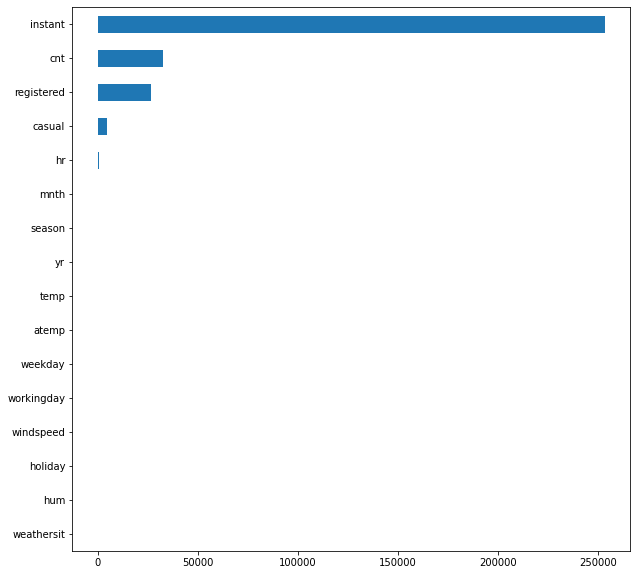

In [122]:
plt.figure(figsize=(10, 10))
covariances.sort_values(ascending=True).plot.barh()

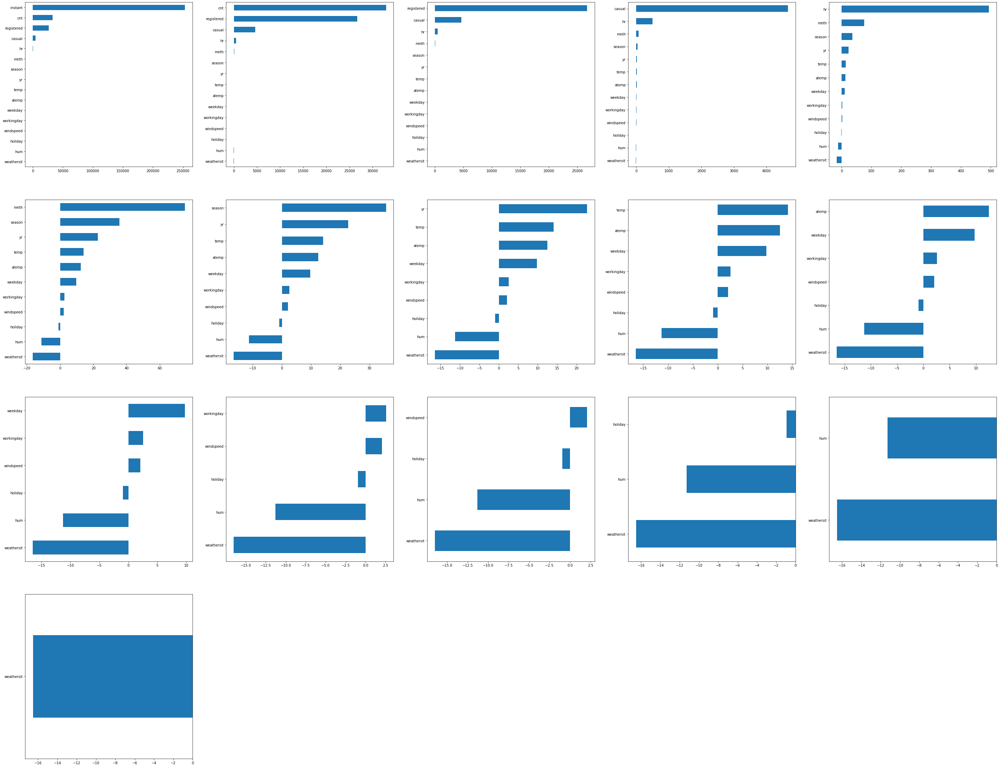

In [123]:
cov_target = numerical_covariance(df, target_var).sort_values(ascending=False)

size = len(cov_target.index)
rs,cs = (size//5+1, 5) if size >= 5 else  (size//3+1, 3)

plt.figure(figsize=(cs*10, rs*10))
for i, col_name in enumerate(cov_target.index):
  plt.subplot(rs, cs, i+1)
  cov_target[col_name:].sort_values(ascending=True).plot.barh()

#### Way-2
```python
# Calculate the covariance between the target and the feature
cov = {  col: [ np.cov(df[target_var].cat.codes, df[col])[0,1] ] for col in num_cols }
cov_s = pd.Series(np.squeeze(list(cov.values())), index=cov.keys())
cov_s
```

## Bivariate & Multivariate Analysis

In [124]:
num_cols

Index(['instant', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [125]:
cat_cols

Index(['dteday'], dtype='object')

In [126]:
len(df.columns) == (len(num_cols) + len(cat_cols))

True

<AxesSubplot:>

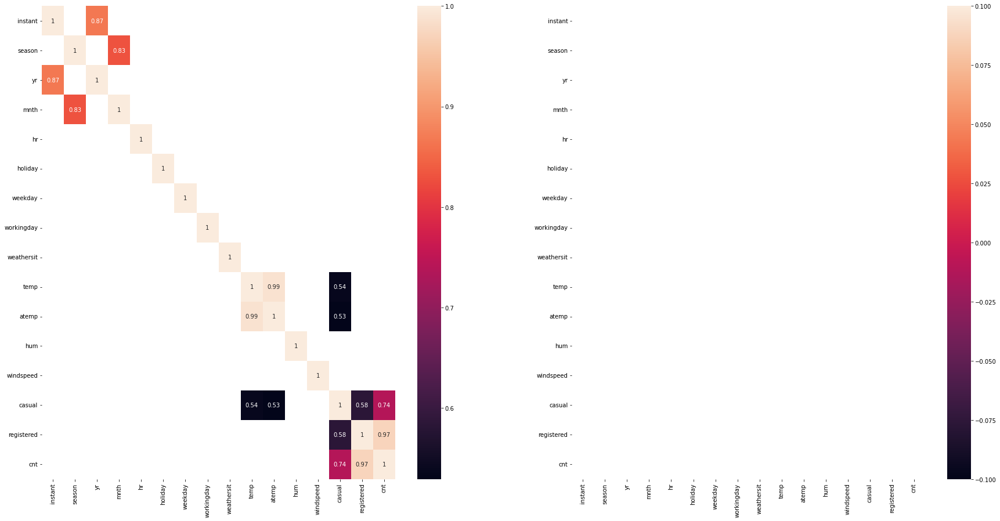

In [127]:
tmp_corrs = df.corr()

plt.figure(figsize=(30,15))

plt.subplot(1,2,1)
sns.heatmap(tmp_corrs[tmp_corrs>0.5], annot=True)

plt.subplot(1,2,2)
sns.heatmap(tmp_corrs[tmp_corrs < -0.5], annot=True)

<AxesSubplot:>

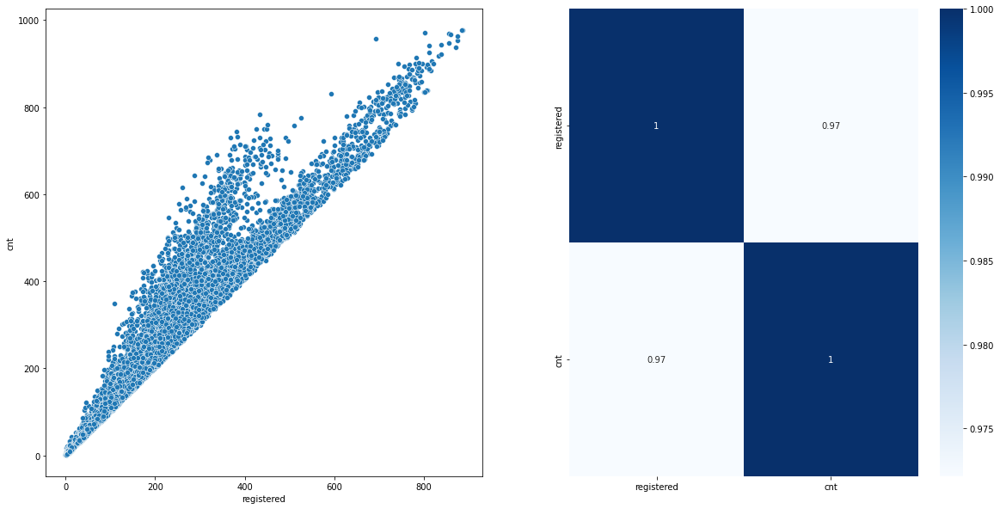

In [128]:
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.scatterplot(df[target_sorted_corrs.index[0]], df[target_var])

plt.subplot(1,2,2)
tmp_corr=df[[target_sorted_corrs.index[0], target_var]].corr()
sns.heatmap(tmp_corr, annot=True,cmap='Blues')

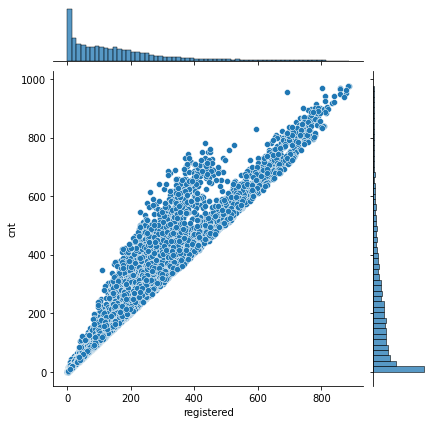

In [129]:
sns.JointGrid(df[target_sorted_corrs.index[0]], df[target_var]).plot(sns.scatterplot, sns.histplot);

<AxesSubplot:>

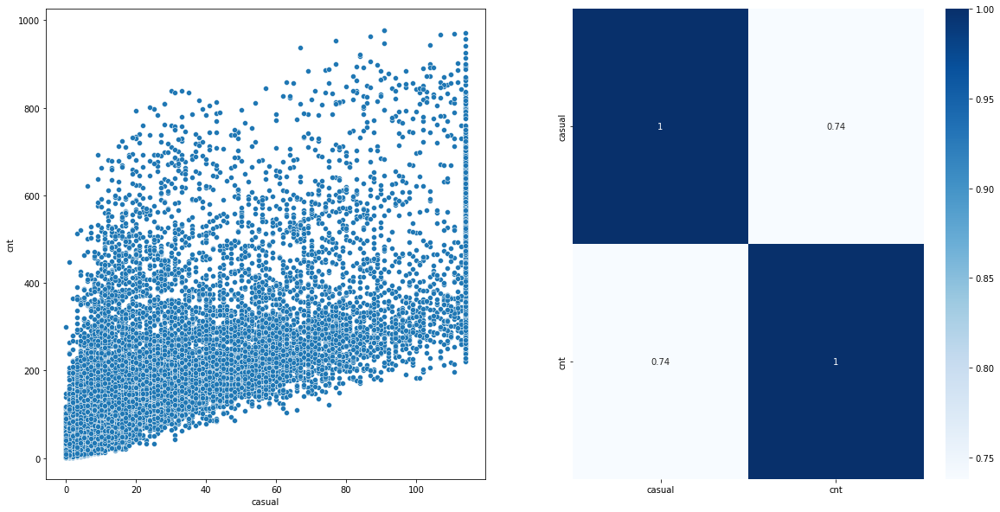

In [130]:
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.scatterplot(df[target_sorted_corrs.index[1]], df[target_var])

plt.subplot(1,2,2)
tmp_corr=df[[target_sorted_corrs.index[1], target_var]].corr()
sns.heatmap(tmp_corr, annot=True,cmap='Blues')

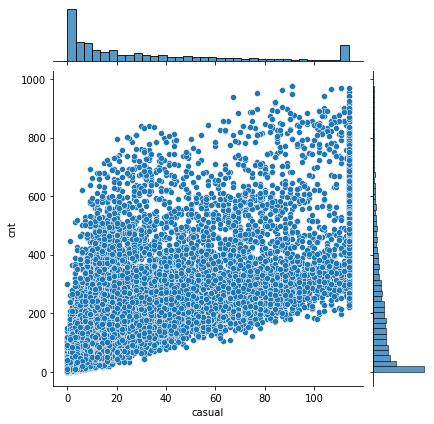

In [131]:
sns.JointGrid(df[target_sorted_corrs.index[1]], df[target_var]).plot(sns.scatterplot, sns.histplot);

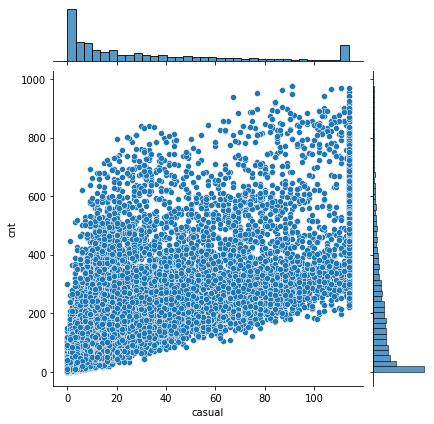

In [132]:
sns.JointGrid(df[target_sorted_corrs.index[1]], df[target_var]).plot(sns.scatterplot, sns.histplot);

ValueError: ignored

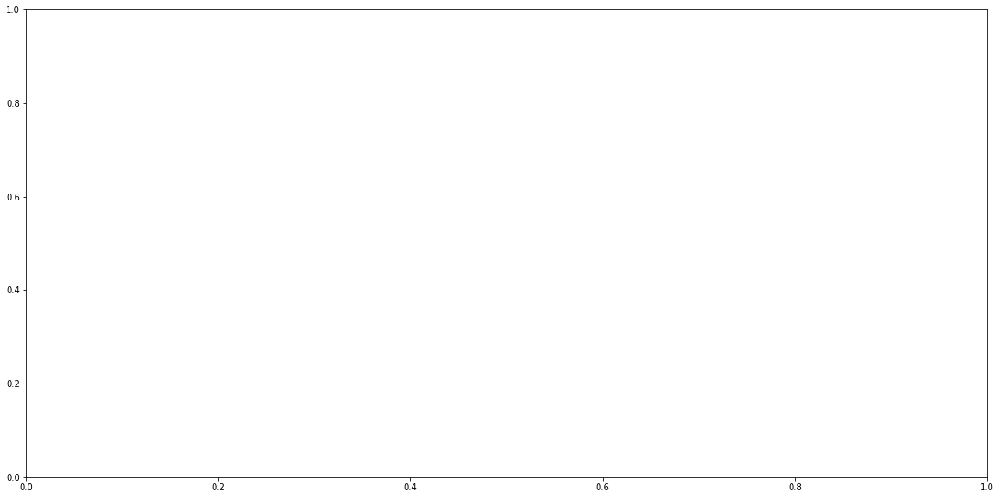

In [138]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='count', hue='weekday', ax=ax)
ax.set(title='Count of bikes during weekdays and weekends')

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='casual', hue='weekday', ax=ax)
ax.set(title='Count of bikes during weekdays and weekends: Unregistered users')

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='registered', hue='weekday', ax=ax)
ax.set(title='Count of bikes during weekdays and weekends: Registered users')

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='count', hue='weather', ax=ax)
ax.set(title='Count of bikes during different weathers')

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='count', hue='season', ax=ax)
ax.set(title='Count of bikes during different seasons')

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=df, x='month', y='count', ax=ax)
ax.set(title='Count of bikes during different months')

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=df, x='weekday', y='count', ax=ax)
ax.set(title='Count of bikes during different days')

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.regplot(x=df['temp'], y=df['count'], ax=ax1)
ax1.set(title="Relation between temperature and users")
sns.regplot(x=df['humidity'], y=df['count'], ax=ax2)
ax2.set(title="Relation between humidity and users")

In [ ]:
from statsmodels.graphics.gofplots import qqplot
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.distplot(df['count'], ax=ax1)
ax1.set(title='Distribution of the users')
qqplot(df['count'], ax=ax2, line='s')
ax2.set(title='Theoritical quantiles')

In [ ]:
df['count'] = np.log(df['count'])

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.distplot(df['count'], ax=ax1)
ax1.set(title='Distribution of the users')
qqplot(df['count'], ax=ax2, line='s')
ax2.set(title='Theoritical quantiles')

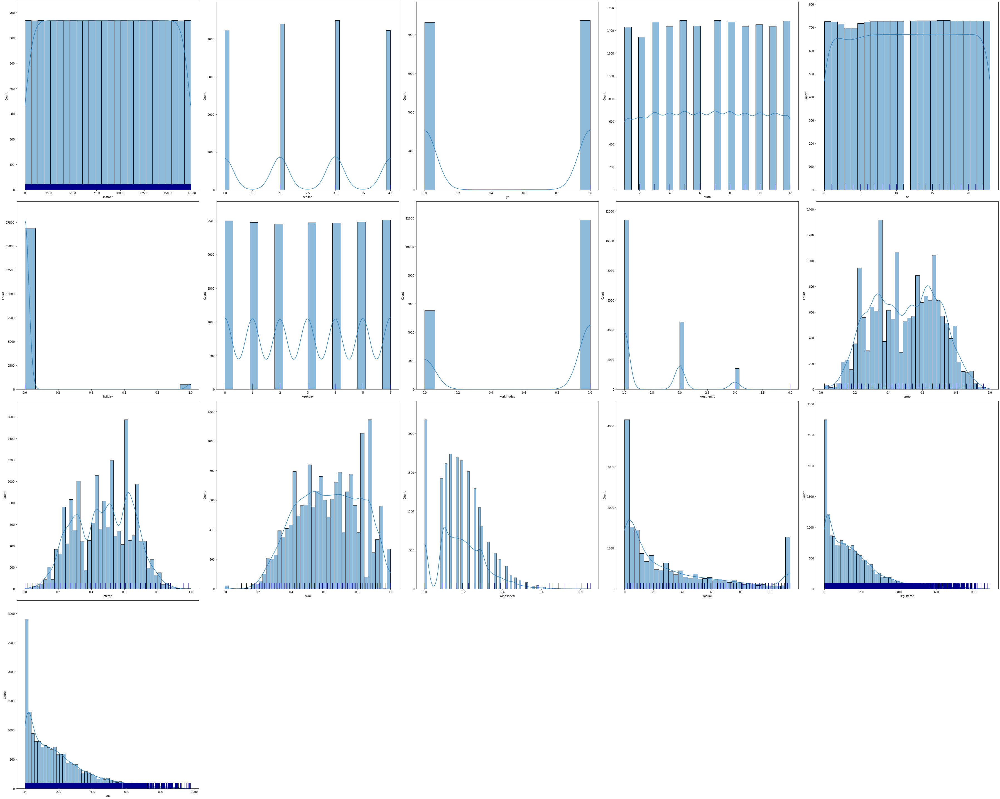

In [133]:
size = len(num_cols)
cs, rs = (5,size//5+1) if size>=5 else (3,size//3+1)

fig = plt.figure( figsize=(cs*10, rs*10))
for i, col in enumerate(num_cols):
    plt.subplot(rs,cs,i+1)
    sns.histplot(x=df[col], data=df, kde=True) #  hue=df[target_var],
    sns.rugplot(x=df[col], data=df,  height=.03, color='darkblue') # hue=df[target_var],
    
fig.tight_layout()  
plt.show()

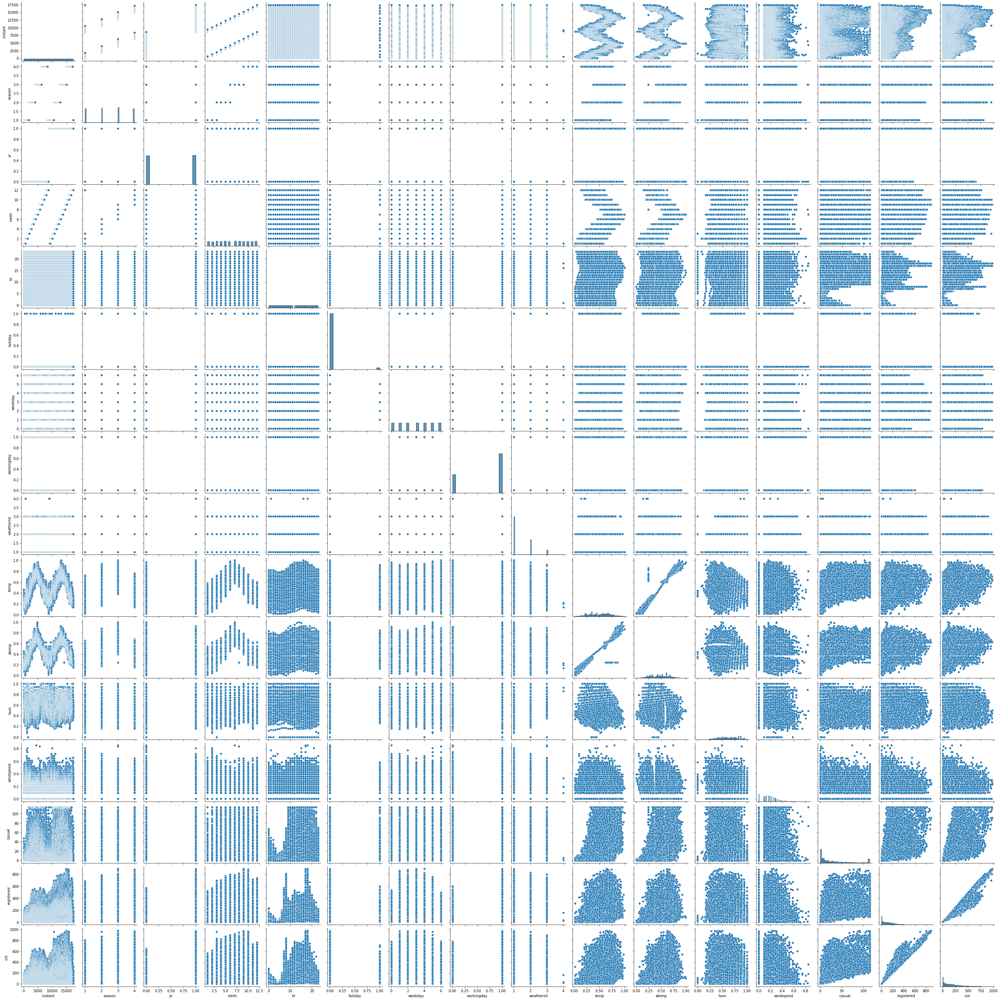

In [134]:
sns.pairplot(df[num_cols]);
# sns.pairplot(df[num_cols], hue=target_var);

<Figure size 1440x1440 with 0 Axes>

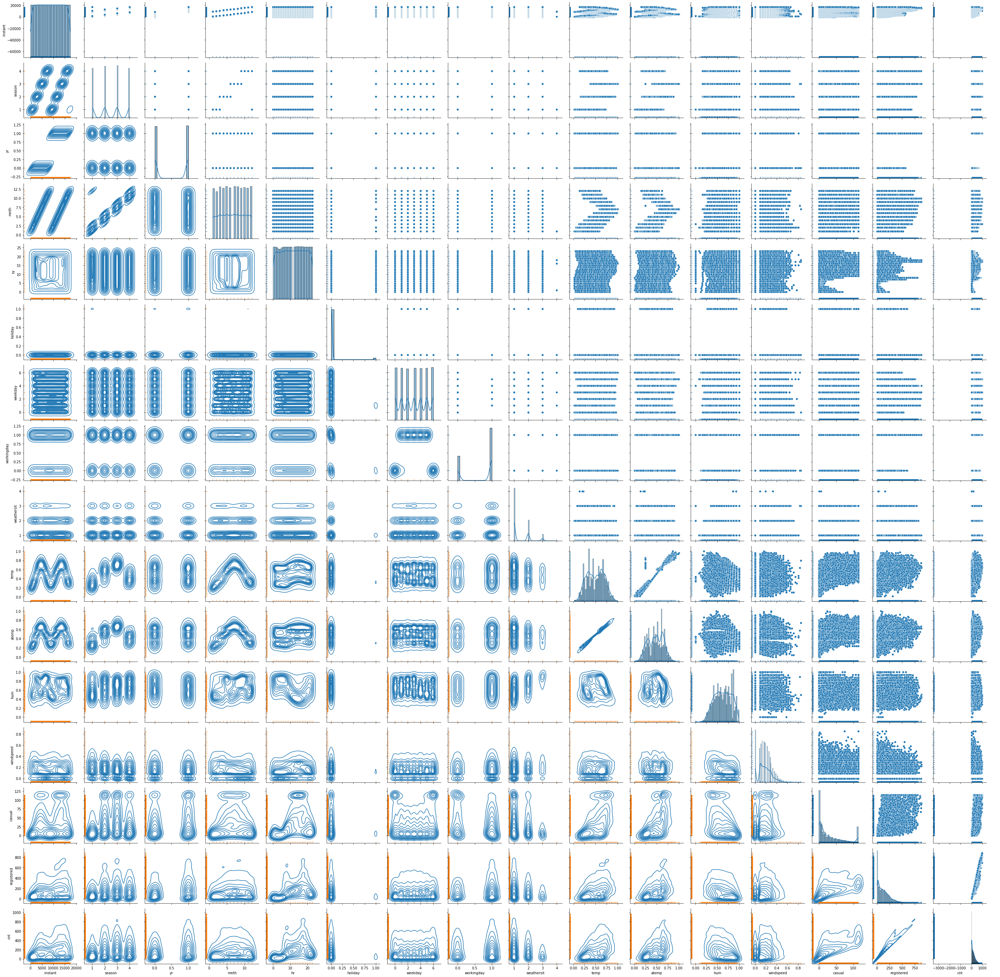

In [135]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df.select_dtypes(exclude=[bool]), diag_sharey=False) # hue=target_var
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)
g.map(sns.rugplot);
g.add_legend();

<Figure size 1440x1440 with 0 Axes>

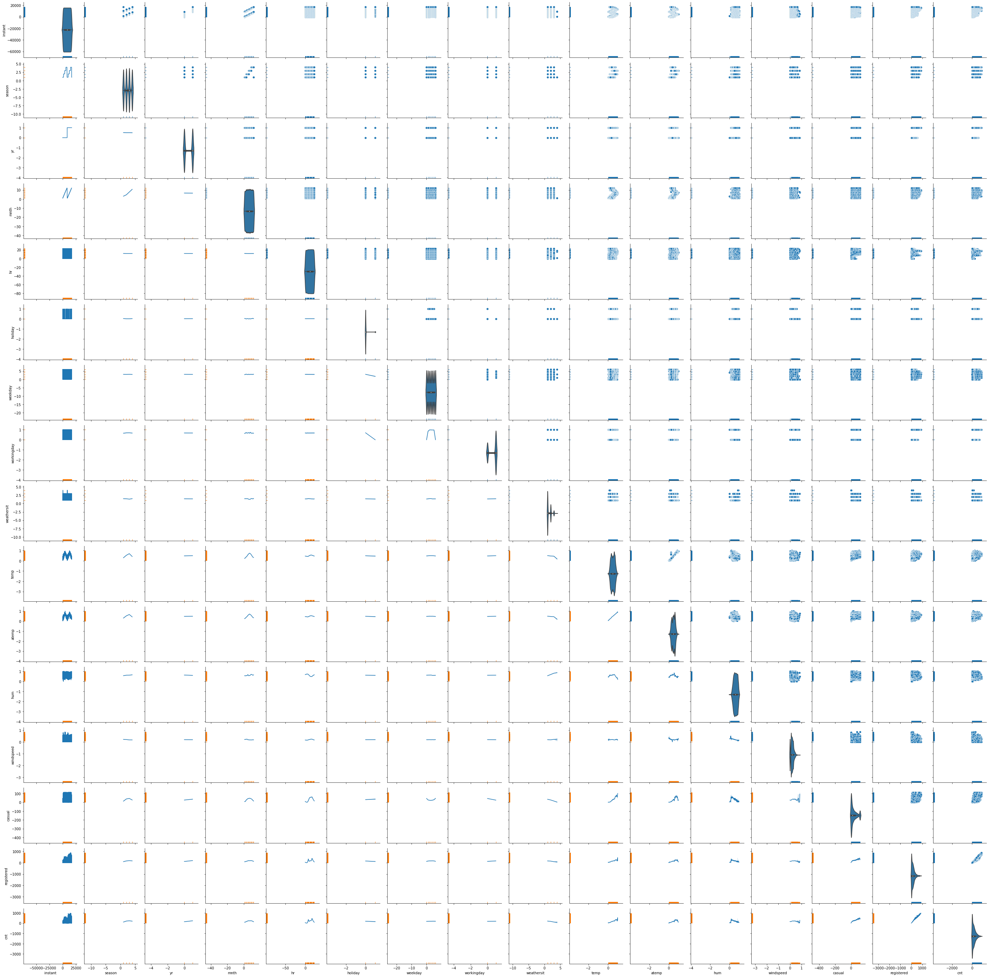

In [136]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df.select_dtypes(exclude=[bool]), diag_sharey=False) # , hue=target_var
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

<Figure size 1440x1440 with 0 Axes>

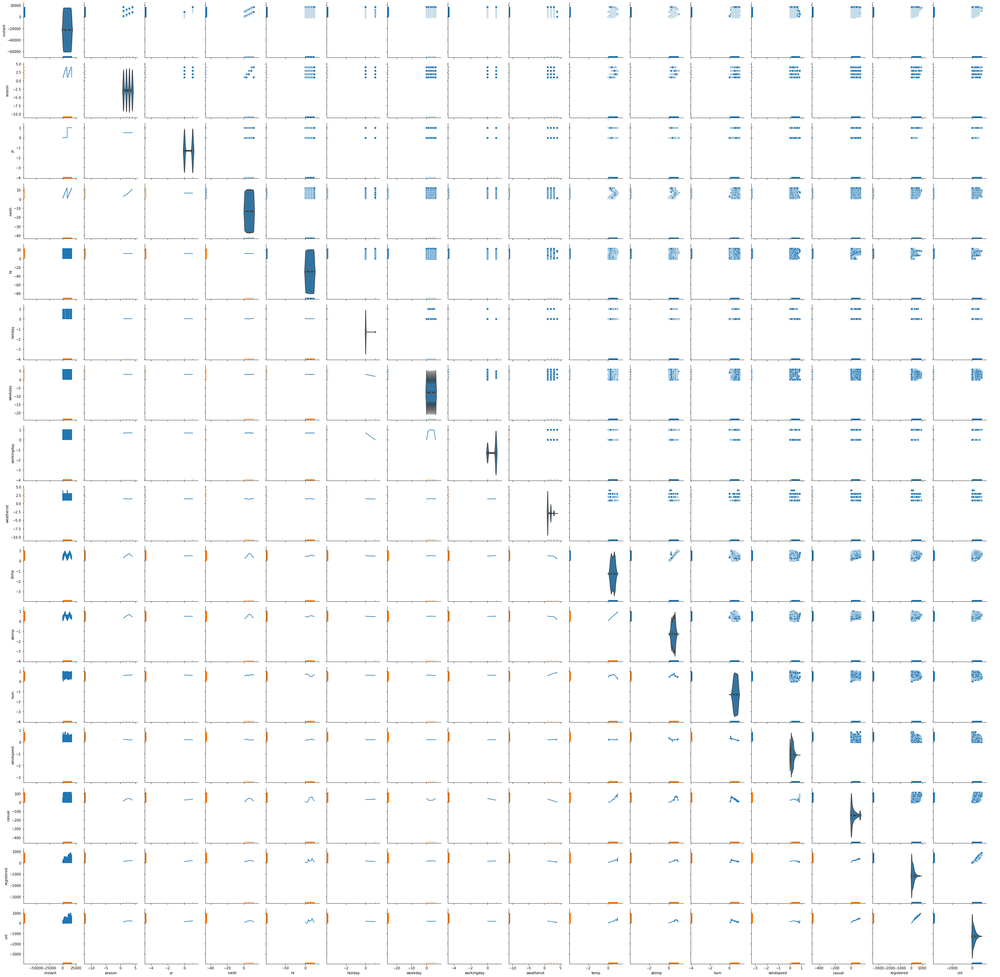

In [137]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df) # ,  hue=target_var
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

```python
row_size, col_size = len(num_cols), len(num_cols)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= df, x=row, y=col, ax=ax) # hue=target_var,
        
fig.tight_layout()  
plt.show()
```

```python
row_size = col_size = len(df.columns)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= df, x=row, y=col, ax=ax) #  hue=target_var,
        
fig.tight_layout()  
plt.show()
```

# (E) Model Selection (Classic ML models)

#### Utils

In [28]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import learning_curve

def plot_learning_curve(model, name, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5), figsize=(20,20)):

    # checking the params
    if ylim is not None: plt.ylim(*ylim)
    
    # pre-declerations
    orange, blue = "#ff9124", "#2492ff"

    # Extracting the learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    # Extracting the scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # calculating params    
    tra_left_edge = train_scores_mean - train_scores_std
    tra_right_edge = train_scores_mean + train_scores_std

    test_left_edge = test_scores_mean - test_scores_std
    test_right_edge = test_scores_mean + test_scores_std

    # transparent plot for confidence value range
    plt.fill_between(train_sizes, tra_left_edge, tra_right_edge, alpha=0.1, color=orange)
    plt.fill_between(train_sizes, test_left_edge, test_right_edge, alpha=0.1, color=blue)
    
    # Plotting as point
    plt.plot(train_sizes, train_scores_mean, 'o-', color=orange, label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color=blue, label="Cross-validation score")
    
    # Configurating the plottings
    plt.title(f"{name} Learning Curve", fontsize=14)
    plt.xlabel('Training size (m)')
    plt.ylabel('Score')
    plt.grid(True)
    plt.legend(loc="best")

In [29]:
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier

def get_learning_curve_stats(clfs, X_train, y_train, cv, model_size, rs, cs, figsize, ylim):

  plt.figure(figsize=figsize)
  # EXtracting the learning curve and validation metrics
  best_models_cross_val_preds, roc_auc_scores = {}, {}
  for i, (name, model) in enumerate(clfs.items()):

    # Training with best models again (the best params already saved inside) for visualizate the duration.
    plt.subplot(rs, cs, i+1)
    print(f"{i}.turn [{name}], plotting learning curve")
    plot_learning_curve(model, name, X_train, y_train, ylim, cv=cv, n_jobs=-1, figsize=figsize) 

    # validating the trained models
    #print(f"{i}.turn, cross_validation")
    #method = "decision_function" if name in ["loj_reg", "svc"] else "predict"
    #best_models_cross_val_preds[name]  = cross_val_predict(model, X_train, y_train, cv=5, method=method)

    # Displating the roc scores
    #print(f"{i}.turn, roc_auc_scores")
    #roc_auc_scores[name] = roc_auc_score(y_train, best_models_cross_val_preds[name])
    #print(f'{name:<20}: ',roc_auc_scores[name])

  return plt.gcf()#, best_models_cross_val_preds#, roc_auc_scores

```python
# Example Usage
model_size = len(us_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=100, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (40,20),
    "ylim" : (0.87, 1.01)
}

lc_plot, best_models_cross_val_preds, roc_auc_scores  = get_learning_curve_stats(us_models, figsize=(40,10), **lcs_params)
```

## Prepare The Data To Training

### Remove Unnessesary Variables

In [30]:
df.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [31]:
df.drop(columns=['instant', 'dteday' ,'atemp', 'windspeed', 'casual', 'registered'], inplace=True)

### Encoding the categorical variables

##### Label Encoding

In [32]:
cat_cols = df.select_dtypes(include=["object","category"]).columns
num_cols = df.select_dtypes(exclude=["object","category"]).columns

In [33]:
cat_cols

Index([], dtype='object')

In [34]:
from sklearn.preprocessing import LabelEncoder

# 'Outlet_Identifier'
encoders = {}
for col in cat_cols:
  # creating encoder for current variable
  encoders[col]= LabelEncoder()

  # Label encoding
  df[col] = encoders[col].fit_transform(df[col])

In [35]:
if not cat_cols.empty:
  ex_var = cat_cols[0]
  df[ex_var].unique(), encoders[ex_var].inverse_transform(df[ex_var].unique())

In [36]:
if not cat_cols.empty:
  ex_var = cols[1]
  df[ex_var].unique(), encoders[ex_var].inverse_transform(df[ex_var].unique())

##### Onehot Encoding
```python
df.drop(columns=["Item_Type"], inplace=True)
```


```python
one_hot_encoding_cols = ['Item_Fat_Content', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type']
df = pd.get_dummies(df, columns=one_hot_encoding_cols)
df.head()
```
```python
one_hot_encoding_cols = ['Item_Fat_Content', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'New_Item_Type']
df_test = pd.get_dummies(df_test, columns=one_hot_encoding_cols)
df_test.head()
```

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      17379 non-null  int64  
 1   yr          17379 non-null  int64  
 2   mnth        17379 non-null  int64  
 3   hr          17379 non-null  int64  
 4   holiday     17379 non-null  int64  
 5   weekday     17379 non-null  int64  
 6   workingday  17379 non-null  int64  
 7   weathersit  17379 non-null  int64  
 8   temp        17379 non-null  float64
 9   hum         17379 non-null  float64
 10  cnt         17379 non-null  int64  
dtypes: float64(2), int64(9)
memory usage: 1.5 MB


### Splitting the dataset
```python
# train, test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

# train, validation split
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.20)
```

In [38]:
target_var

'cnt'

In [39]:
X = df.drop(columns=[target_var])
y = df[target_var]

#### Train-Test Split

In [40]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

## Util Functions
- Utils functions for model tuning

### Greedy Step tune

In [41]:
from sklearn.model_selection import GridSearchCV
from pprint import pprint

def greedy_search(model, params:dict, X_train, y_train, cv=10, n_jobs=-1, verbose=2, is_print=False):
  """It tunes params individually step by step . select best value on current step.
  It assumes the params sorted by importance on the model as descending. 
  The important param, second important param, etc.... 
  """
  
  best_params = {}
  for name, values in params.items():
    # Initial params
    best_params[name] = values

    if is_print: print("before:");pprint(best_params);
    
    # create GridSearch&Train 
    cv_model = GridSearchCV(model, best_params, cv=cv, n_jobs=n_jobs, verbose=verbose)
    cv_model.fit(X_train, y_train)

    # Update the param
    best_params[name] = [cv_model.best_params_[name]]
    
    if is_print: print("after:");pprint(best_params);print("-"*25, end="\n\n");

  return cv_model, cv_model.best_estimator_, best_params

### Model Tuner

In [42]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report


def gen_clf_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common classification metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)

  clf_metrics = {
            "accuracy":accuracy_score(y_test, y_pred),
            "precision" : precision_score(y_test, y_pred, average="micro"),
            "recall": recall_score(y_test, y_pred, average="micro"),
            "f1_score": f1_score(y_test, y_pred, average="micro"),
            "clf_report":classification_report(y_test, y_pred, output_dict=True)
  }

  if return_y_data:
    clf_metrics["y_pred"] = y_pred
    clf_metrics["y_test"] = y_test
            
  
  return clf_metrics

In [43]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error, median_absolute_error

def gen_reg_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common regression metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)


  reg_metrics = {
      "MaxError": np.max(y_test - y_pred),
      "MeanAbsoluteError": median_absolute_error(y_test, y_pred),
      "MeanAbsolutePercentageError": np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
      "MSE": mean_squared_error(y_test, y_pred),
      "RMSE": mean_squared_error(y_test, y_pred, squared=False),
      "MAE": mean_absolute_error(y_test, y_pred),
      "R2":r2_score(y_test, y_pred),
      "ExplainedVariance":explained_variance_score(y_test, y_pred)
  }

  if return_y_data:
    reg_metrics["y_pred"] = y_pred
    reg_metrics["y_test"] = y_test


  return reg_metrics

In [44]:
import pandas as pd
def tune_models(tuners, X_train, y_train, X_test, y_test, is_clf, cv=10, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
    # Tuning
    cv_model, tuned_model, best_params = greedy_search(model, params, X_train, y_train, cv=cv)
    
    # predicting
    y_pred = tuned_model.predict(X_test)
    metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
    metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

    # Generating results
    cur_results = {
        "tune_results": {
            "cv_model":cv_model,
            "tuned_model":tuned_model,
            "best_params":best_params,
        },
        "metric_results": metric_results
    }
    
    results[name] = cur_results
    metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T


In [45]:
import pandas as pd
def tune_linear_cv_models(tuners, X_train, y_train, X_test, y_test, is_clf, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
      # Tuning
      tuned_model = model(**params)
      tuned_model.fit(X_train, y_train)
      
      # predicting
      y_pred = tuned_model.predict(X_test)
      metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
      metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

      # Generating results
      cur_results = {
          "tune_results": {
              "tuned_model":tuned_model,
              "best_params":tuned_model.get_params(True) ,#best_params_,
          },
          "metric_results": metric_results
      }
      
      results[name] = cur_results
      metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T

## (1) Linear Models

### Hyperparams

In [49]:
lin_params = {
    'fit_intercept': [True, False],
    #'normalize': [True, False],
    'copy_X': [True, False],
}
from sklearn.linear_model import LinearRegression
linear_reg = [LinearRegression(), lin_params]

In [50]:
lasso_params = {
    "alpha": np.logspace(-4, 0, 100).flatten(),
    #'tol': [1e-3, 1e-4],
    #'eps': [1e-2, 1e-3, 1e-4],
    #'fit_intercept': [True, False],
    #'normalize': [True, False],
    #'max_iter': [1000, 5000, 10000],
    'fit_intercept': [True, False],
    #'normalize': [True, False],
    'max_iter': [1000, 5000, 10000]
}

from sklearn.linear_model import Lasso, LassoCV
l1_reg = [Lasso(), lasso_params] 

In [51]:
ridge_params = {
    "alpha": np.logspace(-4, 0, 100), #p.arange(0.00, 1.0, 0.01), #(10**np.linspace(10,-2,100))*0.5,
    #'normalize': [True, False],
    #'tol': [1e-4, 1e-3, 1e-2],
    'fit_intercept': [True, False],
    #'normalize': [True, False]
}

from sklearn.linear_model import Ridge, RidgeCV 
l2_reg = [Ridge(), ridge_params]

In [52]:
ElasticNet_params = {
    "alpha": np.logspace(-4, 0, 100),
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],
    'tol': [1e-4, 1e-3, 1e-2],
    'selection': ['cyclic', 'random'],    
    #'normalize': [True, False],
    'max_iter': [1000, 5000, 10000], 
}
from sklearn.linear_model import ElasticNet, ElasticNetCV 
enet_reg = [ElasticNet(), ElasticNet_params]

In [53]:
linear_cv_tuners = {
    "l1_reg":l1_reg,
    
    "l2_reg":l2_reg,
    "enet_reg":enet_reg
}
linear_tuners = {
    "lin_reg":linear_reg,
    #**linear_cv_tuners
}

### Tuning Demostration

In [54]:
lin_results, lin_metric_summary = tune_models(linear_cv_tuners, X_train, y_train, X_test, y_test, cv=10, is_clf=False, is_round=True)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits


In [55]:
#lin_results, lin_metric_summary = tune_linear_cv_models(linear_cv_tuners, X_train, y_train, X_test, y_test, is_clf=False, is_round=True)

In [56]:
list(lin_results.keys())

['l1_reg', 'l2_reg', 'enet_reg']

In [57]:
lin_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
l1_reg,649.0,82.0,343.060942,20317.065880,142.537945,106.108458,0.387837,0.387837
l2_reg,649.0,82.0,343.014057,20315.509781,142.532487,106.105293,0.387884,0.387884
enet_reg,648.0,82.0,342.883958,20312.021289,142.520249,106.102992,0.387989,0.387991


In [58]:
from pprint import pprint
pprint(lin_results)

{'enet_reg': {'metric_results': {'ExplainedVariance': 0.3879905028729915,
                                 'MAE': 106.1029919447641,
                                 'MSE': 20312.021288837743,
                                 'MaxError': 648,
                                 'MeanAbsoluteError': 82.0,
                                 'MeanAbsolutePercentageError': 342.883958006279,
                                 'R2': 0.38798928792639054,
                                 'RMSE': 142.52024869764205},
              'tune_results': {'best_params': {'alpha': [0.0001747528400007683],
                                               'l1_ratio': [0.5],
                                               'max_iter': [1000],
                                               'selection': ['cyclic'],
                                               'tol': [0.0001]},
                               'cv_model': GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': [0.0001747

In [59]:
#tuned_model
lin_results.keys()

dict_keys(['l1_reg', 'l2_reg', 'enet_reg'])

In [60]:
lin_results["l1_reg"].keys()

dict_keys(['tune_results', 'metric_results'])

In [61]:
lin_results["l1_reg"]["tune_results"].keys()

dict_keys(['cv_model', 'tuned_model', 'best_params'])

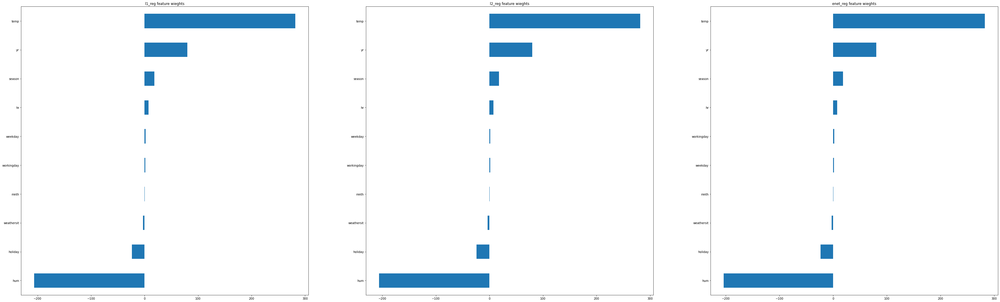

In [62]:
size = len(lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*20))
lin_models = {}
for i, model_name in enumerate(lin_results.keys()):

  cur_model = lin_results[model_name]["tune_results"]["tuned_model"]
  lin_models[model_name] = cur_model
  
  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [l1_reg], plotting learning curve
1.turn [l2_reg], plotting learning curve
2.turn [enet_reg], plotting learning curve


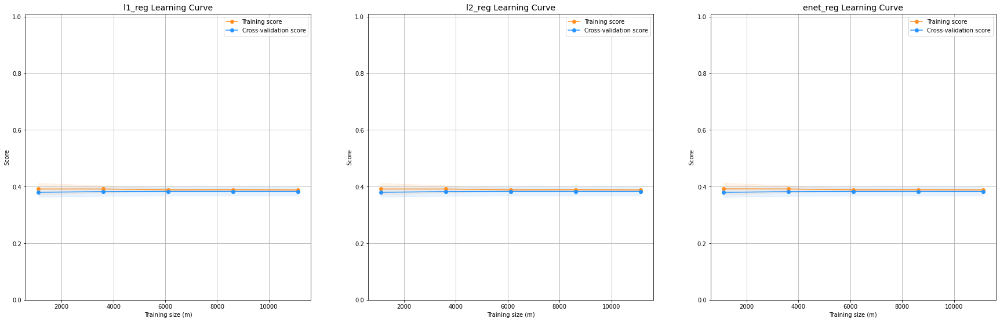

In [63]:
# Example Usage
model_size = len(lin_models)
rs, cs = (model_size//3+1, 3 ) if model_size >= 3 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_models, X_train, y_train,  **lcs_params)

In [64]:
lin_reg_results, lin_reg_metric_summary = tune_models(linear_tuners, X_train, y_train,X_test, y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits


In [65]:
list(lin_reg_results.keys())

['lin_reg']

In [66]:
lin_reg_metric_summary

,ExplainedVariance,MAE,MSE,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,R2,RMSE
lin_reg,0.387854,106.111623,20316.508631,649.0,82.0,343.15311,0.387854,142.535991


In [67]:
from pprint import pprint
pprint(lin_reg_results)

{'lin_reg': {'metric_results': {'ExplainedVariance': 0.38785424564562865,
                                'MAE': 106.11162255466053,
                                'MSE': 20316.508630609896,
                                'MaxError': 649,
                                'MeanAbsoluteError': 82.0,
                                'MeanAbsolutePercentageError': 343.1531099877021,
                                'R2': 0.3878540822177001,
                                'RMSE': 142.5359906501158},
             'tune_results': {'best_params': {'copy_X': [True],
                                              'fit_intercept': [False]},
                              'cv_model': GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True], 'fit_intercept': [False]},
             verbose=2),
                              'tuned_model': LinearRegression(fit_intercept=False)}}}


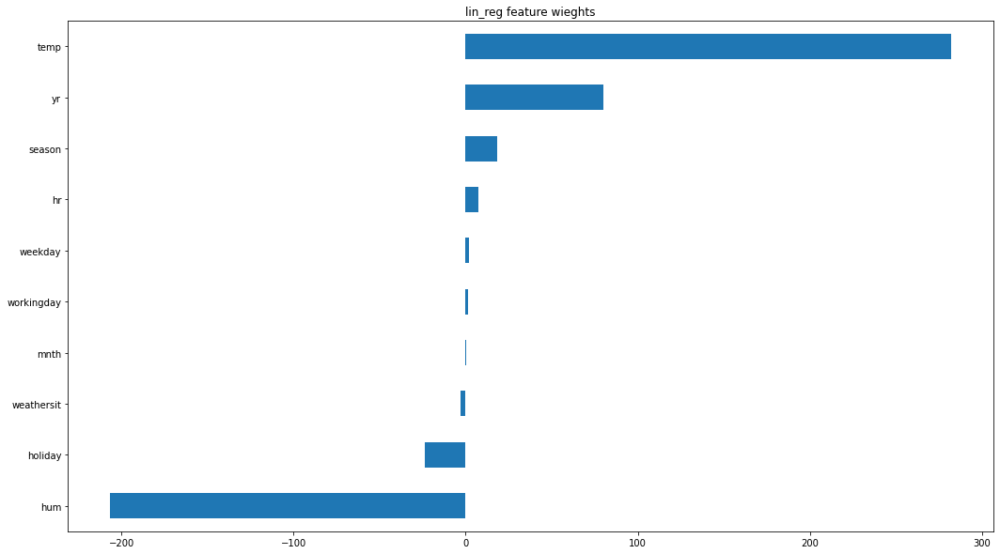

In [68]:
size = len(lin_reg_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*10))
lin_reg_models = dict()
for i, model_name in enumerate(lin_reg_results.keys()):

  cur_model = lin_reg_results[model_name]["tune_results"]["tuned_model"]
  lin_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [lin_reg], plotting learning curve


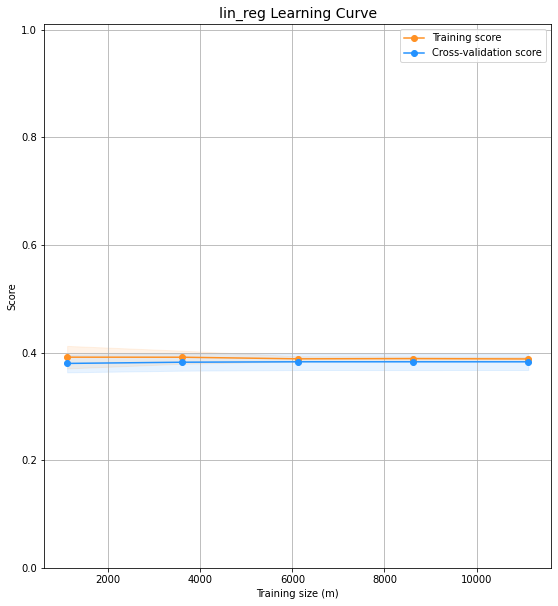

In [69]:
# Example Usage
model_size = len(lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_reg_models, X_train, y_train,  **lcs_params)

## (2) Non-Linear Models 

##### Hyperparams

In [76]:
knn_params = {
    "n_neighbors": np.arange(1, 31, 2),
    "weights": ["uniform", "distance"],
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],
    "leaf_size": np.arange(20, 61, 10),
    "p": [1, 2],
}
from sklearn.neighbors import KNeighborsRegressor
knn_reg = [KNeighborsRegressor(), knn_params]

In [77]:
svr_params = {
    "C": np.logspace(-3, 3, 7),
    #"kernel": ["linear","rbf"],#["linear", "poly", "rbf", "sigmoid"],
    #"degree": [2, 3, 4],
    #"gamma": ["scale", "auto"] + list(np.logspace(-3, 3, 7)),
    #"epsilon":[0.01, 0.1, 1, 10, 100],
    #"coef0": np.linspace(-1, 1, 21),
    #"shrinking": [True, False],
    #"tol": [1e-4, 1e-3, 1e-2],
    #"max_iter": [-1, 500, 1000, 2000]
}
from sklearn.svm import SVR
svr_reg = [SVR(), svr_params]

In [78]:
dt_params = {
    "criterion": ["mse", "friedman_mse", "mae"],
    "splitter": ["best", "random"],
    "max_depth": [None, 5, 10, 15, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 5],
    #"min_weight_fraction_leaf": [0.0, 0.1, 0.2],
    #"max_features": ["auto", "sqrt", "log2", None],
    #"random_state": [0, 42, 123],
    #"presort": [True, False]
}
from sklearn.tree import DecisionTreeRegressor
dt_reg = [DecisionTreeRegressor(), dt_params]

In [79]:
non_lin_reg_tuners = {
    "knn_reg":knn_reg,
    "svr_reg":svr_reg,
    "dt_params":dt_reg
}

##### Tuning Demostration

In [80]:
non_lin_results, non_lin_metric_summary = tune_models(non_lin_reg_tuners, X_train, y_train, X_test, y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 7 candidates, totalling 70 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits


In [81]:
list(non_lin_results.keys())

['knn_reg', 'svr_reg', 'dt_params']

In [82]:
non_lin_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
knn_reg,375.0,18.0,39.408859,2707.928654,52.037762,31.837169,0.918409,0.918671
svr_reg,671.0,34.0,78.921862,13725.668585,117.156599,68.708285,0.586439,0.608872
dt_params,543.0,17.0,36.896549,2919.705121,54.034296,31.352992,0.912028,0.912043


In [83]:
from pprint import pprint
pprint(non_lin_results)

{'dt_params': {'metric_results': {'ExplainedVariance': 0.9120432178681253,
                                  'MAE': 31.352991944764096,
                                  'MSE': 2919.7051208285384,
                                  'MaxError': 543,
                                  'MeanAbsoluteError': 17.0,
                                  'MeanAbsolutePercentageError': 36.89654863797608,
                                  'R2': 0.912027917624072,
                                  'RMSE': 54.03429578359043},
               'tune_results': {'best_params': {'criterion': ['friedman_mse'],
                                                'max_depth': [15],
                                                'min_samples_leaf': [2],
                                                'min_samples_split': [10],
                                                'splitter': ['best']},
                                'cv_model': GridSearchCV(cv=10, estimator=DecisionTreeRegressor(), n_jobs=-1,
           

In [84]:
non_lin_reg_models = {model_name:results["tune_results"]["tuned_model"] for model_name, results in non_lin_results.items() }

0.turn [knn_reg], plotting learning curve
1.turn [svr_reg], plotting learning curve
2.turn [dt_params], plotting learning curve


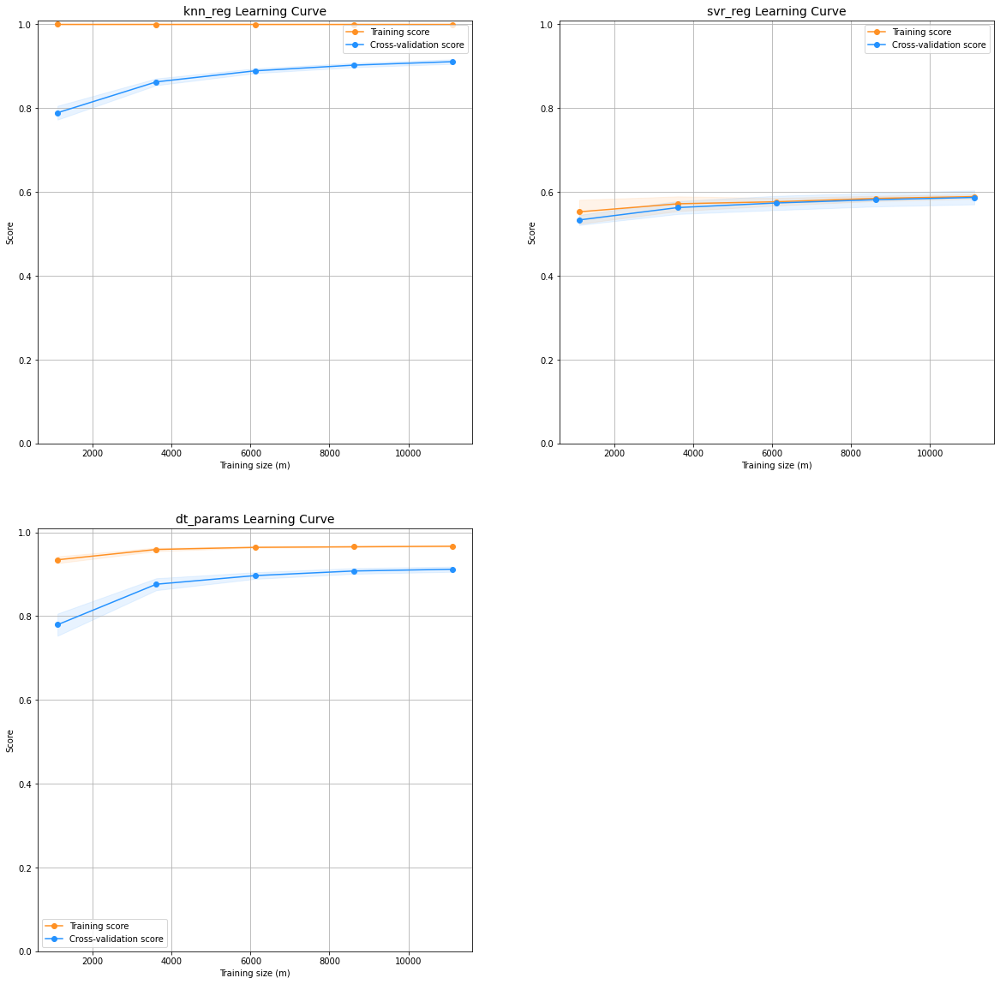

In [85]:
# Example Usage
model_size = len(non_lin_reg_models)
rs, cs = (model_size//4+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(non_lin_reg_models, X_train, y_train,  **lcs_params)

## (3) Ensemble Models

#### Hyperparams

In [80]:
# Defining parameters
rf_params = {
    "n_estimators": [10, 50, 100, 200],
    "max_features": ['auto', 'sqrt'],
    #"max_depth": [3, 5, 7, None],
    "min_samples_split": [2, 3, 4, 5],
    "min_samples_leaf": [1, 2, 3, 4],
    # 'bootstrap': [True, False]
}
from sklearn.ensemble import RandomForestRegressor
rf = [RandomForestRegressor(), rf_params] 

In [81]:
# Defining parameters
gbr_params = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.05, 0.1, 0.2],
    #'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    #'max_features': ['auto', 'sqrt', 'log2'],
    #'subsample': [0.7, 0.8, 0.9]
}
from sklearn.ensemble import GradientBoostingRegressor
gbr = [GradientBoostingRegressor(), gbr_params] 

In [82]:
# Defining parameters
xgbr_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'max_depth': [3, 5, 7],
    #'min_child_weight': [1, 2, 4],
    #'gamma': [0, 0.1, 0.2],
    #'subsample': [0.7, 0.8, 0.9],
    #'colsample_bytree': [0.7, 0.8, 0.9],
    #'reg_alpha': [0, 1e-1, 1],
    #'reg_lambda': [0, 1e-1, 1]
}
from xgboost import XGBRegressor
xgbr = [XGBRegressor(), xgbr_params] 

In [83]:
# Defining parameters
lgbm_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'num_leaves': [31, 63, 127],
    #'max_depth': [3, 5, 7],
    'min_child_samples': [10, 20, 30],
    #'min_child_weight': [1e-3, 1e-2, 1e-1],
    #'subsample': [0.7, 0.8, 0.9],
    #'colsample_bytree': [0.7, 0.8, 0.9],
    #'reg_alpha': [0, 1e-1, 1],
    #'reg_lambda': [0, 1e-1, 1]
}
from lightgbm import LGBMRegressor
lgbm = [LGBMRegressor(), lgbm_params] 

In [84]:
import os
if os.system("pip freeze | grep catboost==") != 0: os.system("pip install catboost")

cb_params = {
    'bagging_temperature': [0.5, 0.7, 0.9],
    'learning_rate': [0.1, 0.05, 0.01],
    'subsample': [0.5, 0.7, 0.9],
    #'depth': [3, 5, 7],
    #'l2_leaf_reg': [1, 2, 4],
    #'boosting_type': ['Ordered', 'Plain', 'Pointwise'],
    #'colsample_bylevel': [0.7, 0.8, 0.9],
    #'reg_lambda': [0, 1e-1, 1] # or # 'l2_leaf_reg': [1, 2, 4]
}
from catboost import CatBoostRegressor
cb = [CatBoostRegressor(), cb_params] 

In [85]:
ensemble_tuners = {
    "rf":rf,
    "gbr":gbr,
    "xgbr":xgbr,
    "lgbm":lgbm,
    "cb":cb
}

### Tuning Demostration

In [86]:
ensemble_results, ensemble_metric_summary = tune_models(ensemble_tuners,X_train, y_train, X_test, y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Learning rate set to 0.062057
0:	learn: 174.5696624	total: 49ms	remaining: 48.9s
1:	learn: 168.0996329	total: 51.4ms	remaining: 25.6s
2:	learn: 16

In [87]:
list(ensemble_results)

['rf', 'gbr', 'xgbr', 'lgbm', 'cb']

In [88]:
ensemble_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
rf,371.0,14.0,29.631831,2042.205696,45.190770,26.081991,0.939230,0.939243
gbr,383.0,23.5,69.352007,3321.348389,57.631141,38.065880,0.901167,0.901167
xgbr,388.0,15.0,34.368587,1719.380610,41.465415,25.001438,0.948837,0.948837
lgbm,411.0,14.0,35.085998,1720.200230,41.475297,24.815305,0.948812,0.948813
cb,394.0,14.0,38.254069,1668.108746,40.842487,24.497699,0.950362,0.950362


In [89]:
from pprint import pprint
pprint(ensemble_results)

{'cb': {'metric_results': {'ExplainedVariance': 0.950362273707443,
                           'MAE': 24.497698504027618,
                           'MSE': 1668.1087456846951,
                           'MaxError': 394,
                           'MeanAbsoluteError': 14.0,
                           'MeanAbsolutePercentageError': 38.2540693592812,
                           'R2': 0.9503622642404632,
                           'RMSE': 40.842487016398685},
        'tune_results': {'best_params': {'bagging_temperature': [0.5],
                                         'learning_rate': [0.1],
                                         'subsample': [0.7]},
                         'cv_model': GridSearchCV(cv=10,
             estimator=<catboost.core.CatBoostRegressor object at 0x7f2975602e50>,
             n_jobs=-1,
             param_grid={'bagging_temperature': [0.5], 'learning_rate': [0.1],
                         'subsample': [0.7]},
             verbose=2),
                         'tune

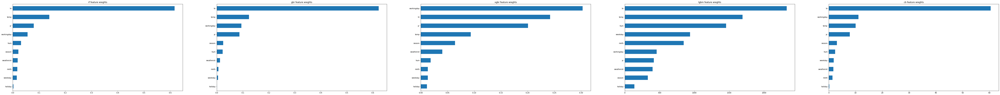

In [90]:
es_model_names = [col for col in ensemble_results.keys() if col not in ["bag_reg"]]
size = len(es_model_names)
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*20, rs*10))
ensemble_reg_models = dict()
for i, model_name in enumerate(es_model_names):
  if model_name in ["bag_reg"]: continue

  cur_model = ensemble_results[model_name]["tune_results"]["tuned_model"]
  ensemble_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.feature_importances_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [rf], plotting learning curve
1.turn [gbr], plotting learning curve
2.turn [xgbr], plotting learning curve
3.turn [lgbm], plotting learning curve
4.turn [cb], plotting learning curve


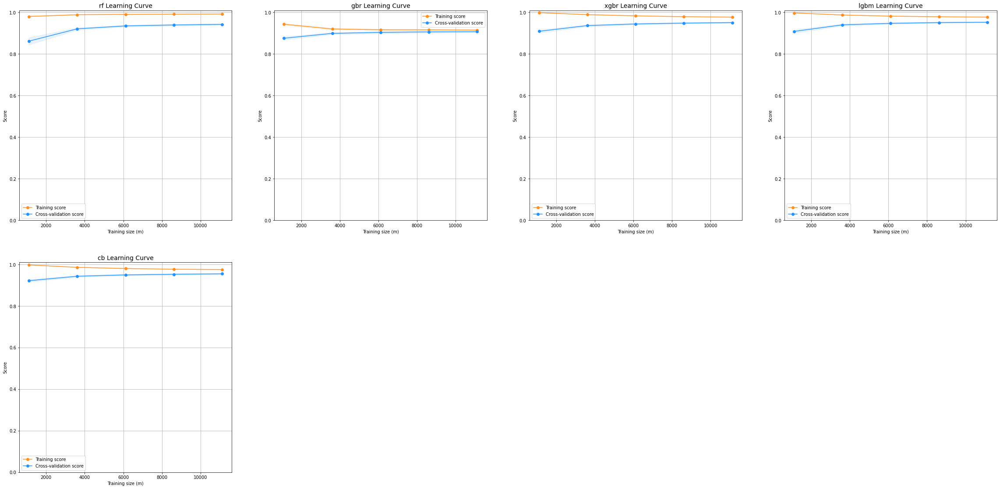

In [91]:
# Example Usage
model_size = len(ensemble_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(ensemble_reg_models, X_train, y_train,  **lcs_params)

## (4) Final Model

### Top models

In [92]:
# lin_results, lin_metric_summary
# lin_reg_results, lin_reg_metric_summary
# non_lin_results, non_lin_metric_summary
# ensemble_results, ensemble_metric_summary

In [93]:
#all_results = [lin_results, lin_reg_results, non_lin_results, ensemble_results]
all_results = [ensemble_results]

In [ ]:
lin_models = pd.concat([lin_metric_summary, lin_reg_metric_summary])
lin_models = lin_models.sort_values(by=['RMSE','R2'], ascending=True)
lin_models

In [98]:
non_linear_model = pd.concat([ensemble_metric_summary]) # non_lin_metric_summary
non_linear_model = non_linear_model.sort_values(by=['RMSE','R2'],  ascending=True)
non_linear_model

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
cb,394.0,14.0,38.254069,1668.108746,40.842487,24.497699,0.950362,0.950362
xgbr,388.0,15.0,34.368587,1719.380610,41.465415,25.001438,0.948837,0.948837
lgbm,411.0,14.0,35.085998,1720.200230,41.475297,24.815305,0.948812,0.948813
rf,371.0,14.0,29.631831,2042.205696,45.190770,26.081991,0.939230,0.939243
gbr,383.0,23.5,69.352007,3321.348389,57.631141,38.065880,0.901167,0.901167


In [99]:
non_linear_model.index

Index(['cb', 'xgbr', 'lgbm', 'rf', 'gbr'], dtype='object')

In [ ]:
all_models = pd.concat([lin_metric_summary, lin_reg_metric_summary, non_lin_metric_summary, ensemble_metric_summary])
all_models = all_models.sort_values(by=['RMSE','R2'], ascending=True)
all_models

### Greedy Selection

In [100]:
best_model_name =non_linear_model.iloc[0].name #all_models.iloc[0].name
best_model_name

'cb'

In [101]:
tuned_model, best_params = None, None
for results in all_results:
  if best_model_name in results:
      tuned_model = results[best_model_name]["tune_results"]["tuned_model"]
      best_params = results[best_model_name]["tune_results"]["best_params"]

In [102]:
tuned_model.score(X_test, y_test)

0.950352376808715

In [103]:
from sklearn.model_selection import cross_val_score
cross_val_score(tuned_model, X_train, y_train, cv=10).mean(), cross_val_score(tuned_model, X_test, y_test, cv=10).mean()

Streaming output truncated to the last 5000 lines.
0:	learn: 174.6531727	total: 792us	remaining: 792ms
1:	learn: 166.7694728	total: 2.04ms	remaining: 1.02s
2:	learn: 157.3619872	total: 3.45ms	remaining: 1.15s
3:	learn: 149.6658504	total: 4.34ms	remaining: 1.08s
4:	learn: 145.0385549	total: 5.11ms	remaining: 1.02s
5:	learn: 139.2607126	total: 6ms	remaining: 994ms
6:	learn: 134.6819993	total: 6.96ms	remaining: 988ms
7:	learn: 128.4776324	total: 7.9ms	remaining: 979ms
8:	learn: 124.1602328	total: 8.87ms	remaining: 976ms
9:	learn: 119.2729197	total: 9.78ms	remaining: 968ms
10:	learn: 115.9855683	total: 10.7ms	remaining: 959ms
11:	learn: 113.2041396	total: 11.6ms	remaining: 955ms
12:	learn: 109.6662883	total: 12.5ms	remaining: 951ms
13:	learn: 104.8132552	total: 13.6ms	remaining: 958ms
14:	learn: 102.8744240	total: 14.5ms	remaining: 952ms
15:	learn: 99.7269816	total: 15.4ms	remaining: 947ms
16:	learn: 98.3800204	total: 16.3ms	remaining: 941ms
17:	learn: 97.0192654	total: 17.3ms	remaining: 9

(0.9560078922639896, 0.9378196350106034)

# (F) Saving & Downloading the model

### Saving the model

In [171]:
import pickle
model_save_path = 'finalized_model.sav'
pickle.dump(tuned_model, open(model_save_path, 'wb'))

### Loading the model

In [172]:
loaded_model = pickle.load(open(model_save_path, 'rb'))

In [173]:
loaded_model.score(X_test, y_test)

0.950352376808715

In [174]:
loaded_model.score(X_train, y_train)

0.9731295037708381

### Zipping the model
```python
import os 
zip_dst, src = f"{model_save_path}.zip", model_save_path
os.system(f"zip -r {zip_dst} {src}" )
```

### Downloading the model

In [139]:
from google.colab import files
files.download(model_save_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# (G) Deployment as App

## APP (loading from file)

### Declerations & Util Funcs

In [1]:
!pip install gradio
import gradio as gr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 KB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 KB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 KB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 40.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.7/140.7 KB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 KB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 KB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 KB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 KB

In [3]:
import pickle
import os
import json 
import numpy as np
import pandas as pd
if os.system("pip freeze | grep catboost==") != 0: os.system("pip install catboost")

# File Paths
model_path = 'finalized_model.sav'
component_config_path = "component_configs.json"

# predefined
feature_order = ['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'hum']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

feature_limitations = json.load(open(component_config_path, "r"))

In [4]:
examples = [
  [4.0, 0.0, 10.0, 2.0, 0.0, 6.0, 0.0, 1.0, 0.4, 0.62],
  [4.0, 0.0, 10.0, 11.0, 0.0, 1.0, 1.0, 2.0, 0.4, 0.71],
  [4.0, 1.0, 10.0, 1.0, 0.0, 3.0, 1.0, 2.0, 0.62, 0.94],
  [4.0, 1.0, 12.0, 19.0, 0.0, 2.0, 1.0, 1.0, 0.38, 0.46],
  [2.0, 1.0, 4.0, 2.0, 0.0, 5.0, 1.0, 1.0, 0.44, 0.88],
  [4.0, 1.0, 12.0, 14.0, 0.0, 2.0, 1.0, 2.0, 0.38, 0.5]
 ]

In [5]:
total_examples = [[4.0, 0.0, 10.0, 2.0, 0.0, 6.0, 0.0, 1.0, 0.4, 0.62, 31],
 [4.0, 0.0, 10.0, 11.0, 0.0, 1.0, 1.0, 2.0, 0.4, 0.71, 126],
 [4.0, 1.0, 10.0, 1.0, 0.0, 3.0, 1.0, 2.0, 0.62, 0.94, 19],
 [4.0, 1.0, 12.0, 19.0, 0.0, 2.0, 1.0, 1.0, 0.38, 0.46, 353],
 [2.0, 1.0, 4.0, 2.0, 0.0, 5.0, 1.0, 1.0, 0.44, 0.88, 21],
 [4.0, 1.0, 12.0, 14.0, 0.0, 2.0, 1.0, 2.0, 0.38, 0.5, 204]]

In [6]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=feature_order)
  features = np.array(features).reshape(-1, len(feature_order))

  # prediction
  pred = model.predict(features) #.predict(features)

  return np.round(pred,5)

In [7]:
ex_data = [2.0, 0.0, 5.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.52, 0.94]
predict(*ex_data)

array([18.57016])

### Declerating the components

In [15]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


/usr/local/lib/python3.8/dist-packages/gradio/inputs.py:89: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)


### Launching the demo app

In [16]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "number", examples=examples).launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

In [40]:
RMSE(0, 18)

18.0

In [8]:
import gradio as gr
from sklearn.metrics import mean_squared_error
import numpy as np

def RMSE(actual, pred):
    return np.around(np.sqrt(mean_squared_error([actual],[pred])),3)

inputs = []
with gr.Blocks() as demo:

    for col in feature_order:
      if col in feature_limitations["cat"].keys():
        
        # extracting the params
        vals = feature_limitations["cat"][col]["values"]
        def_val = feature_limitations["cat"][col]["def"]
        
        # creating the component
        inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
      else:
        
        # extracting the params
        min = feature_limitations["num"][col]["min"]
        max = feature_limitations["num"][col]["max"]
        def_val = feature_limitations["num"][col]["def"]
        
        # creating the component
        inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col))
    
    pred_btn = gr.Button("Predict")
    output = gr.Number(label="Prediction")
    pred_btn.click(fn=predict, inputs=inputs, outputs=output) #examples=examples
    
    loss_btn = gr.Button("calculate loss")
    actual = gr.Number(value=14, label="Actual Value", )
    loss = gr.Number(label="RMSE")
    loss_btn.click(fn=RMSE, inputs=[actual, output], outputs=loss)


    gr.Examples(total_examples, [*inputs, actual])


demo.launch()

/usr/local/lib/python3.8/dist-packages/gradio/inputs.py:89: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

## Manuels (with out file, code form)

### Declerations & Util Funcs

In [175]:
import pickle
import json 
import numpy as np
import pandas as pd

# File Paths
model_path = 'finalized_model.sav'
component_config_path = "component_configs.json"

# predefined
feature_order = ['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'hum']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

#feature_limitations = json.load(open(component_config_path, "r"))

In [227]:
examples = [
  [4.0, 0.0, 10.0, 2.0, 0.0, 6.0, 0.0, 1.0, 0.4, 0.62],
  [4.0, 0.0, 10.0, 11.0, 0.0, 1.0, 1.0, 2.0, 0.4, 0.71],
  [4.0, 1.0, 10.0, 1.0, 0.0, 3.0, 1.0, 2.0, 0.62, 0.94],
  [4.0, 1.0, 12.0, 19.0, 0.0, 2.0, 1.0, 1.0, 0.38, 0.46],
  [2.0, 1.0, 4.0, 2.0, 0.0, 5.0, 1.0, 1.0, 0.44, 0.88],
  [4.0, 1.0, 12.0, 14.0, 0.0, 2.0, 1.0, 2.0, 0.38, 0.5]
 ]

In [195]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=feature_order)
  features = np.array(features).reshape(-1, len(feature_order))

  # prediction
  pred = model.predict(features) #.predict(features)

  return np.round(pred,5)

### Extracting the input params

In [177]:
ex_obs_fea, ex_obs_tar = dict(X_test.iloc[0,:]), y_test.iloc[0]
ex_obs_fea, ex_obs_tar

({'season': 2.0,
  'yr': 0.0,
  'mnth': 5.0,
  'hr': 1.0,
  'holiday': 0.0,
  'weekday': 1.0,
  'workingday': 1.0,
  'weathersit': 1.0,
  'temp': 0.52,
  'hum': 0.94},
 14)

In [178]:
def_vals = ex_obs_fea.copy()
def_vals

{'season': 2.0,
 'yr': 0.0,
 'mnth': 5.0,
 'hr': 1.0,
 'holiday': 0.0,
 'weekday': 1.0,
 'workingday': 1.0,
 'weathersit': 1.0,
 'temp': 0.52,
 'hum': 0.94}

In [179]:
feature_order = ex_obs_fea.keys()
feature_order

dict_keys(['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'hum'])

In [180]:
predict(*list(def_vals.values()))

array([18.57016])

In [193]:
predict(*list(def_vals.values()))

array([18.57016])

In [181]:
ex_obs_fea

{'season': 2.0,
 'yr': 0.0,
 'mnth': 5.0,
 'hr': 1.0,
 'holiday': 0.0,
 'weekday': 1.0,
 'workingday': 1.0,
 'weathersit': 1.0,
 'temp': 0.52,
 'hum': 0.94}

In [182]:
ex_obs_fea.values()

dict_values([2.0, 0.0, 5.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.52, 0.94])

In [208]:
import numpy as np

num_limitations = {}
for col in df.select_dtypes(exclude=["object",bool]).drop(columns=["cnt"]).columns:
  num_limitations[col] = {
          "min": float(df[col].min()),
          "max": float(df[col].max()),
          "def": float(ex_obs_fea[col])
      }

In [209]:
cat_cols

Index([], dtype='object')

In [210]:
total_limitations = {
    "num":num_limitations,
    "cat":{}
}

In [211]:
feature_limitations = total_limitations.copy()
# removing target classes
#del feature_limitations["cat"]["Loan_Status"]

In [212]:
component_config_path = "component_configs.json"
with open(component_config_path,"w+") as f: json.dump(feature_limitations, f)

In [213]:
print(json.dumps(feature_limitations, indent=4))

{
    "num": {
        "season": {
            "min": 1.0,
            "max": 4.0,
            "def": 2.0
        },
        "yr": {
            "min": 0.0,
            "max": 1.0,
            "def": 0.0
        },
        "mnth": {
            "min": 1.0,
            "max": 12.0,
            "def": 5.0
        },
        "hr": {
            "min": 0.0,
            "max": 23.0,
            "def": 1.0
        },
        "holiday": {
            "min": 0.0,
            "max": 1.0,
            "def": 0.0
        },
        "weekday": {
            "min": 0.0,
            "max": 6.0,
            "def": 1.0
        },
        "workingday": {
            "min": 0.0,
            "max": 1.0,
            "def": 1.0
        },
        "weathersit": {
            "min": 1.0,
            "max": 4.0,
            "def": 1.0
        },
        "temp": {
            "min": 0.02,
            "max": 1.0,
            "def": 0.52
        },
        "hum": {
            "min": 0.0,
            "max": 1.0,


In [214]:
from google.colab import files
files.download(component_config_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [232]:
examples_x, exaples_y, total_ex = [], [], []
for i in  range(2,8):
  
  x = list(dict(X_test.iloc[i,:]).values())
  y = y_test.iloc[i]

  examples_x.append(x)
  exaples_y.append(y)
  
  current_total = []
  current_total.extend(x)
  current_total.extend([y])
  total_ex.append(current_total)

In [233]:
examples_x

[[4.0, 0.0, 10.0, 2.0, 0.0, 6.0, 0.0, 1.0, 0.4, 0.62],
 [4.0, 0.0, 10.0, 11.0, 0.0, 1.0, 1.0, 2.0, 0.4, 0.71],
 [4.0, 1.0, 10.0, 1.0, 0.0, 3.0, 1.0, 2.0, 0.62, 0.94],
 [4.0, 1.0, 12.0, 19.0, 0.0, 2.0, 1.0, 1.0, 0.38, 0.46],
 [2.0, 1.0, 4.0, 2.0, 0.0, 5.0, 1.0, 1.0, 0.44, 0.88],
 [4.0, 1.0, 12.0, 14.0, 0.0, 2.0, 1.0, 2.0, 0.38, 0.5]]

In [234]:
total_ex

[[4.0, 0.0, 10.0, 2.0, 0.0, 6.0, 0.0, 1.0, 0.4, 0.62, 31],
 [4.0, 0.0, 10.0, 11.0, 0.0, 1.0, 1.0, 2.0, 0.4, 0.71, 126],
 [4.0, 1.0, 10.0, 1.0, 0.0, 3.0, 1.0, 2.0, 0.62, 0.94, 19],
 [4.0, 1.0, 12.0, 19.0, 0.0, 2.0, 1.0, 1.0, 0.38, 0.46, 353],
 [2.0, 1.0, 4.0, 2.0, 0.0, 5.0, 1.0, 1.0, 0.44, 0.88, 21],
 [4.0, 1.0, 12.0, 14.0, 0.0, 2.0, 1.0, 2.0, 0.38, 0.5, 204]]

### Declerating the components

In [216]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


### Launching the demo app

In [235]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "number",  examples=total_ex).launch() # examples

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

In [170]:
y_train.min(), y_train.max() 

(1, 976)

#Others

## Dataset Information

   Bike sharing systems are new generation of traditional bike rentals where whole process from membership, rental and return back has become automatic. Through these systems, user is able to easily rent a bike from a particular position and return back at another position. Currently, there are about over 500 bike-sharing programs around the world which is composed of over 500 thousands bicycles. Today, there exists great interest in these systems due to their important role in traffic, environmental and health issues.

   Apart from interesting real world applications of bike sharing systems, the characteristics of data being generated by these systems make them attractive for the research. Opposed to other transport services such as bus or subway, the duration of travel, departure and arrival position is explicitly recorded in these systems. This feature turns bike sharing system into a virtual sensor network that can be used for sensing mobility in the city. Hence, it is expected that most of important events in the city could be detected via monitoring these data.


### Attribute Information:

Both hour.csv and day.csv have the following fields, except hr which is not available in day.csv

- instant: record index
- dteday : date
- season : season (1:winter, 2:spring, 3:summer, 4:fall)
- yr : year (0: 2011, 1:2012)
- mnth : month ( 1 to 12)
- hr : hour (0 to 23)
- holiday : weather day is holiday or not (extracted from [Web Link])
- weekday : day of the week
- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
+ weathersit :
- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- temp : Normalized temperature in Celsius. The values are derived via (t-t_min)/(t_max-t_min), t_min=-8, t_max=+39 (only in hourly scale)
- atemp: Normalized feeling temperature in Celsius. The values are derived via (t-t_min)/(t_max-t_min), t_min=-16, t_max=+50 (only in hourly scale)
- hum: Normalized humidity. The values are divided to 100 (max)
- windspeed: Normalized wind speed. The values are divided to 67 (max)
- casual: count of casual users
- registered: count of registered users
- cnt: count of total rental bikes including both casual and registered

## Import modules

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')
pd.options.display.max_columns = 999

## Loading the dataset

In [ ]:
df = pd.read_csv('hour.csv')
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [ ]:
# statistical info
df.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [ ]:
# datatype info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [ ]:
# unique values
df.apply(lambda x: len(x.unique()))

instant       17379
dteday          731
season            4
yr                2
mnth             12
hr               24
holiday           2
weekday           7
workingday        2
weathersit        4
temp             50
atemp            65
hum              89
windspeed        30
casual          322
registered      776
cnt             869
dtype: int64

## Preprocessing the dataset

In [ ]:
# check for null values
df.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [ ]:
df = df.rename(columns={'weathersit':'weather',
                       'yr':'year',
                       'mnth':'month',
                       'hr':'hour',
                       'hum':'humidity',
                       'cnt':'count'})
df.head()

,instant,dteday,season,year,month,hour,holiday,weekday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [ ]:
df = df.drop(columns=['instant', 'dteday', 'year'])

In [ ]:
# change int columns to category
cols = ['season','month','hour','holiday','weekday','workingday','weather']

for col in cols:
    df[col] = df[col].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   season      17379 non-null  category
 1   month       17379 non-null  category
 2   hour        17379 non-null  category
 3   holiday     17379 non-null  category
 4   weekday     17379 non-null  category
 5   workingday  17379 non-null  category
 6   weather     17379 non-null  category
 7   temp        17379 non-null  float64 
 8   atemp       17379 non-null  float64 
 9   humidity    17379 non-null  float64 
 10  windspeed   17379 non-null  float64 
 11  casual      17379 non-null  int64   
 12  registered  17379 non-null  int64   
 13  count       17379 non-null  int64   
dtypes: category(7), float64(4), int64(3)
memory usage: 1.0 MB


## Exploratory Data Analysis

[Text(0.5, 1.0, 'Count of bikes during weekdays and weekends')]

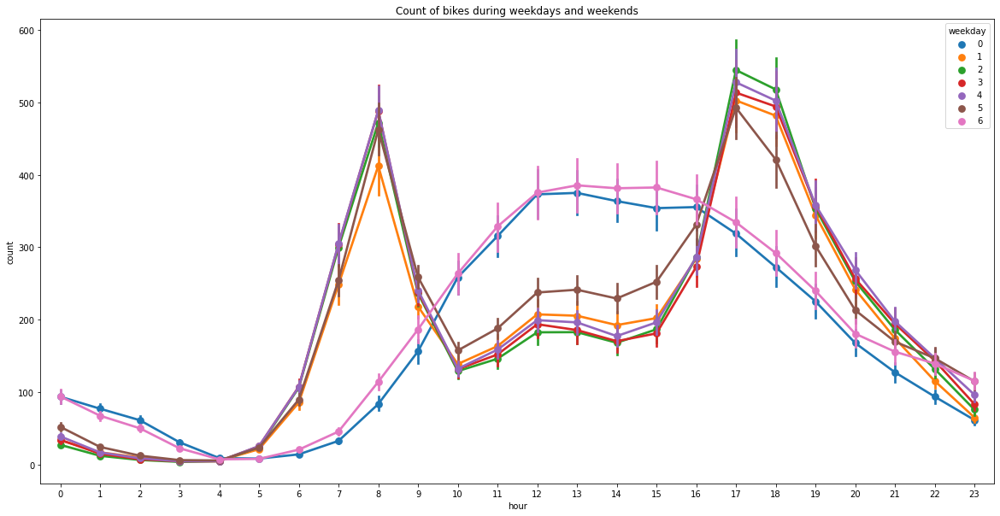

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='count', hue='weekday', ax=ax)
ax.set(title='Count of bikes during weekdays and weekends')

[Text(0.5, 1.0, 'Count of bikes during weekdays and weekends: Unregistered users')]

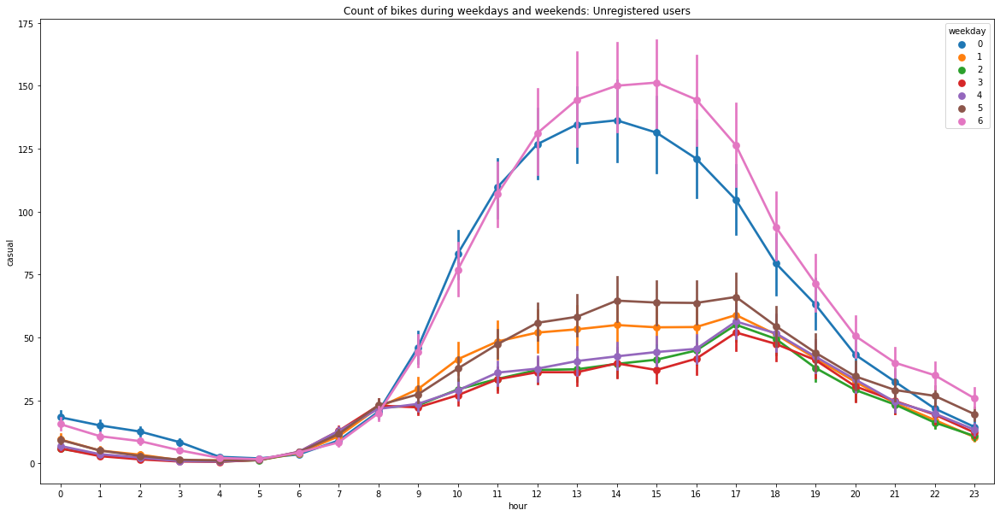

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='casual', hue='weekday', ax=ax)
ax.set(title='Count of bikes during weekdays and weekends: Unregistered users')

[Text(0.5, 1.0, 'Count of bikes during weekdays and weekends: Registered users')]

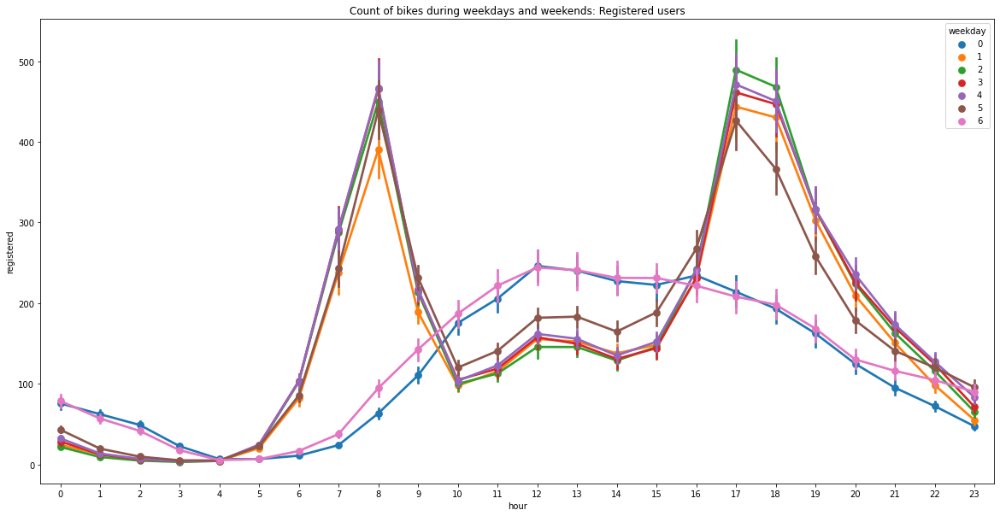

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='registered', hue='weekday', ax=ax)
ax.set(title='Count of bikes during weekdays and weekends: Registered users')

[Text(0.5, 1.0, 'Count of bikes during different weathers')]

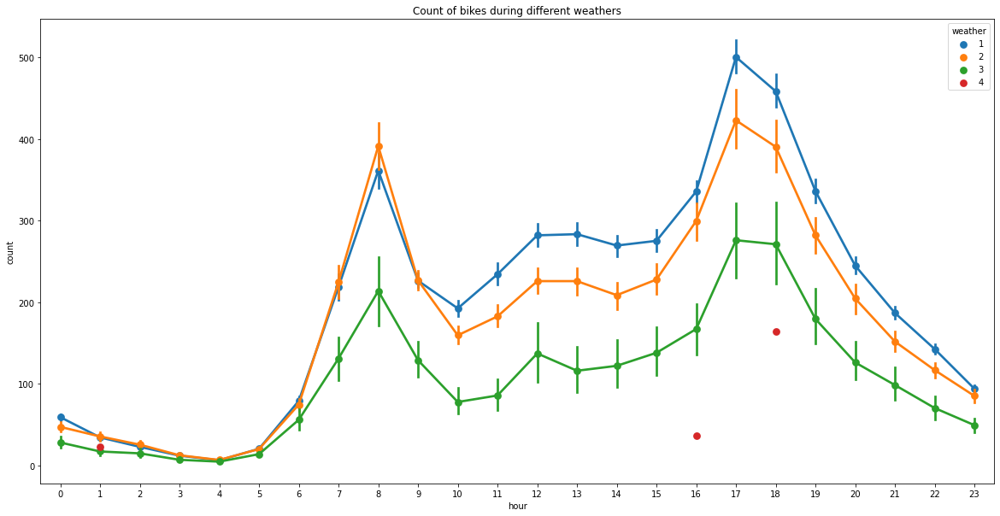

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='count', hue='weather', ax=ax)
ax.set(title='Count of bikes during different weathers')

[Text(0.5, 1.0, 'Count of bikes during different seasons')]

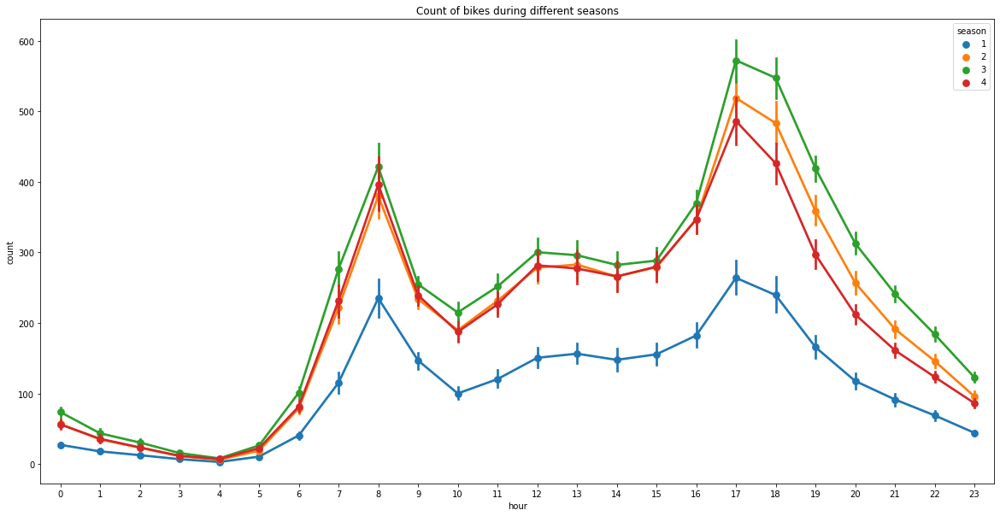

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.pointplot(data=df, x='hour', y='count', hue='season', ax=ax)
ax.set(title='Count of bikes during different seasons')

[Text(0.5, 1.0, 'Count of bikes during different months')]

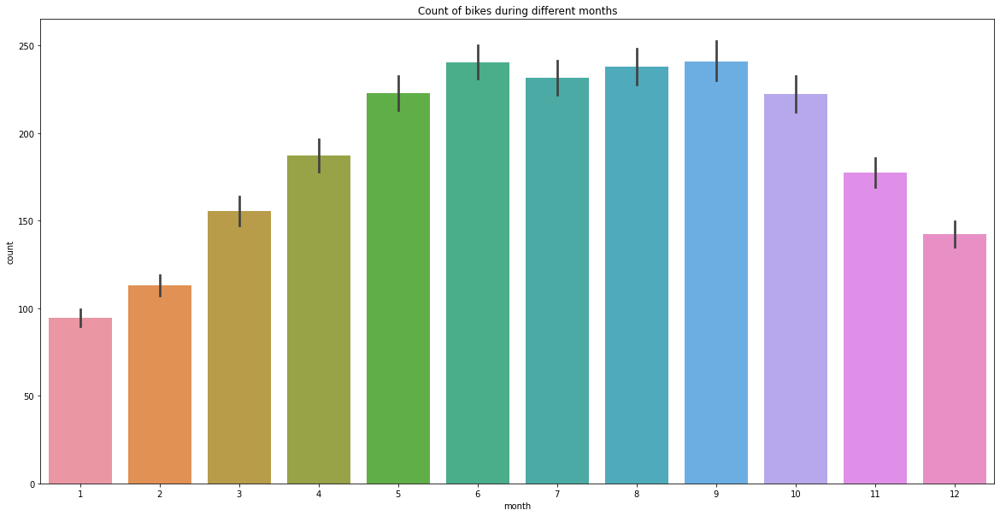

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=df, x='month', y='count', ax=ax)
ax.set(title='Count of bikes during different months')

[Text(0.5, 1.0, 'Count of bikes during different days')]

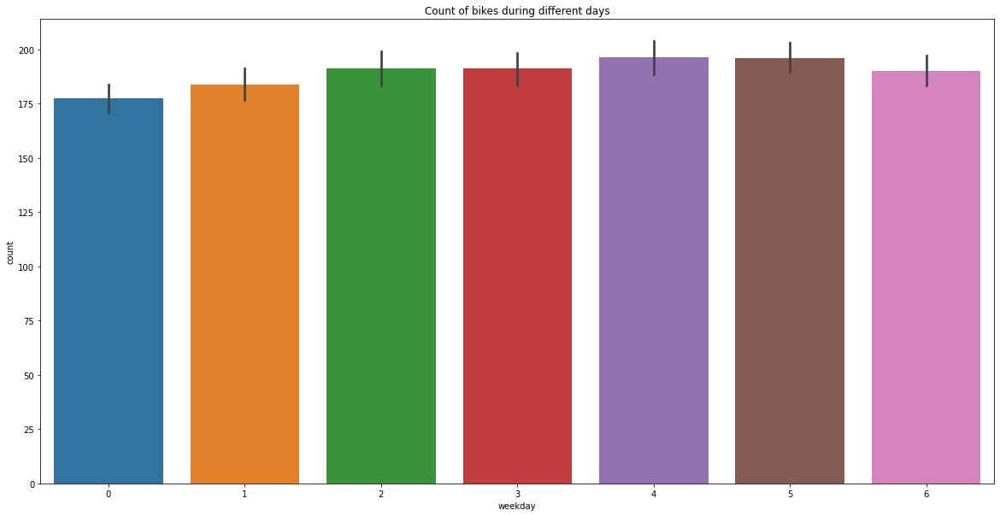

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=df, x='weekday', y='count', ax=ax)
ax.set(title='Count of bikes during different days')

[Text(0.5, 1.0, 'Relation between humidity and users')]

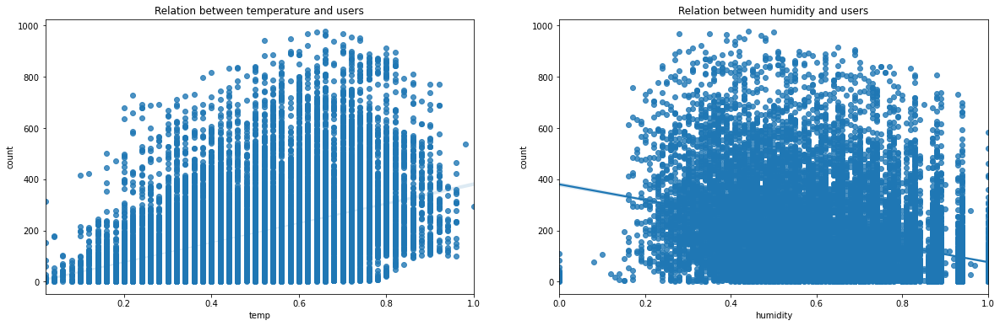

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.regplot(x=df['temp'], y=df['count'], ax=ax1)
ax1.set(title="Relation between temperature and users")
sns.regplot(x=df['humidity'], y=df['count'], ax=ax2)
ax2.set(title="Relation between humidity and users")

[Text(0.5, 1.0, 'Theoritical quantiles')]

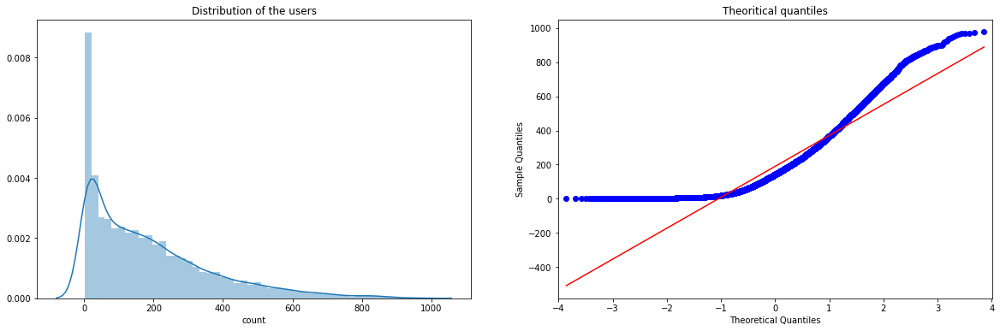

In [ ]:
from statsmodels.graphics.gofplots import qqplot
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.distplot(df['count'], ax=ax1)
ax1.set(title='Distribution of the users')
qqplot(df['count'], ax=ax2, line='s')
ax2.set(title='Theoritical quantiles')

In [ ]:
df['count'] = np.log(df['count'])

[Text(0.5, 1.0, 'Theoritical quantiles')]

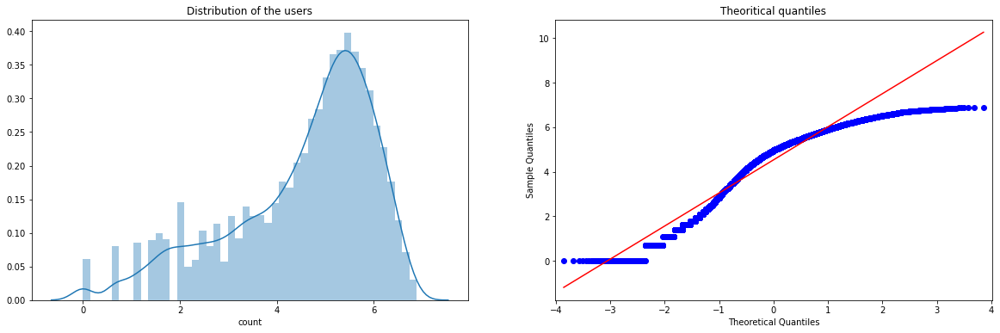

In [ ]:
fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(20,6))
sns.distplot(df['count'], ax=ax1)
ax1.set(title='Distribution of the users')
qqplot(df['count'], ax=ax2, line='s')
ax2.set(title='Theoritical quantiles')

## Coorelation Matrix



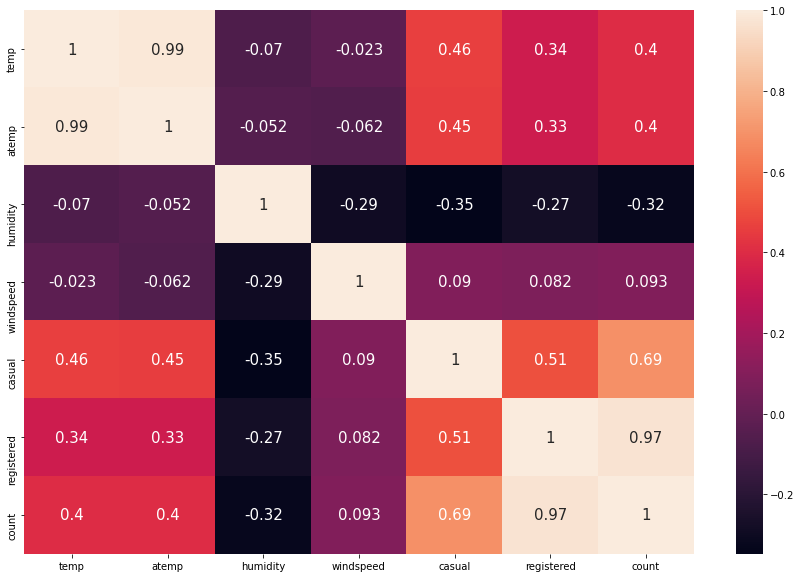

In [ ]:
corr = df.corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, annot_kws={'size':15})

## One hot Encoding

In [ ]:
pd.get_dummies(df['season'], prefix='season', drop_first=True)

,season_2,season_3,season_4
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0
...,...,...,...
17374,0,0,0
17375,0,0,0
17376,0,0,0
17377,0,0,0


In [ ]:
df_oh = df

def one_hot_encoding(data, column):
    data = pd.concat([data, pd.get_dummies(data[column], prefix=column, drop_first=True)], axis=1)
    data = data.drop([column], axis=1)
    return data

cols = ['season','month','hour','holiday','weekday','workingday','weather']

for col in cols:
    df_oh = one_hot_encoding(df_oh, col)
df_oh.head()

,temp,atemp,humidity,windspeed,casual,registered,count,season_2,season_3,season_4,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,holiday_1,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,workingday_1,weather_2,weather_3,weather_4
0,0.24,0.2879,0.81,0.0,3,13,2.772589,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0.22,0.2727,0.80,0.0,8,32,3.688879,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,0.22,0.2727,0.80,0.0,5,27,3.465736,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0.24,0.2879,0.75,0.0,3,10,2.564949,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0.24,0.2879,0.75,0.0,0,1,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


## Input Split

In [ ]:
X = df_oh.drop(columns=['atemp', 'windspeed', 'casual', 'registered', 'count'], axis=1)
y = df_oh['count']

## Model Training

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, HuberRegressor, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor

models = [LinearRegression(),
         Ridge(),
         HuberRegressor(),
         ElasticNetCV(),
         DecisionTreeRegressor(),
         RandomForestRegressor(),
         ExtraTreesRegressor(),
         GradientBoostingRegressor()]

In [ ]:
from sklearn import model_selection
def train(model):
    kfold = model_selection.KFold(n_splits=5, random_state=42)
    pred = model_selection.cross_val_score(model, X, y, cv=kfold, scoring='neg_mean_squared_error')
    cv_score = pred.mean()
    print('Model:',model)
    print('CV score:', abs(cv_score))

In [ ]:
for model in models:
    train(model)

Model: LinearRegression()
CV score: 0.6312365690540037
Model: Ridge()
CV score: 0.6304079414191437
Model: HuberRegressor()
CV score: 0.6603302943755874
Model: ElasticNetCV()
CV score: 0.6252222784219454
Model: DecisionTreeRegressor()
CV score: 0.6105015122390278
Model: RandomForestRegressor()
CV score: 0.38907600449157254
Model: ExtraTreesRegressor()
CV score: 0.40254797123685504
Model: GradientBoostingRegressor()
CV score: 0.47143003710611764


In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [ ]:
model = RandomForestRegressor()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

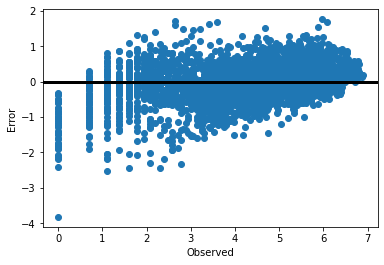

In [ ]:
# plot the error difference
error = y_test - y_pred
fig, ax = plt.subplots()
ax.scatter(y_test, error)
ax.axhline(lw=3, color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Error')
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
np.sqrt(mean_squared_error(y_test, y_pred))

0.4867200945985334